In [1]:
import anndata
import pixelator
import torch
import scvi
import scipy
# from scvi import autotune

import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm

from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection


# import ray
# from ray import tune


from PixelGen.pxl_utils import (convert_edgelist_to_protein_pair_colocalization, pair2str, apply_func_to_neighbors,
    latent_to_distr_correlation, distr_autocorrelation_in_latent, significant_hits_by_cluster_size,
    pairs_to_marginals_correlation, calc_PCA, calc_hvg, plot_cumulative_variance, get_marker_pair_names)
from PixelGen.scvi_utils import plot_validation_loss
from PixelGen.tests import test_convert_edgelist_to_protein_pair_colocalization

from pixelator.statistics import clr_transformation


import tempfile

from scvi import REGISTRY_KEYS
from scvi.module.base import (
    BaseModuleClass,
    LossOutput,
    PyroBaseModuleClass,
    auto_move_data,
)
from torch.distributions import NegativeBinomial, Normal, Poisson
from torch.distributions import kl_divergence as kl

from PixelGen.modules import NormalVAE, NormalSCVI
from cytovi import CytoVI

print(torch.cuda.is_available())

%load_ext autoreload
%autoreload 2

/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.10/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_use_gpu' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


True


In [2]:
# ray.init(log_to_driver=False)

In [3]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
save_dir = tempfile.TemporaryDirectory()

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

Seed set to 0


Last run with scvi-tools version: 1.2.2.post2


In [4]:
pg_data = pixelator.read('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/combined_resting_PHA_data_PROCESSED.pxl')
resting_adata = anndata.read_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/resting_data_with_scores_annotated.h5ad')
stim_adata = anndata.read_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/stim_data_with_scores_annotated.h5ad')
# adata = anndata.read_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/combined_data_coloc_autocorr_with_norm.h5ad')
# resting_adata = adata[adata.obs[adata.obs['sample_class'] == 'resting'].index, :].copy()
# stim_adata = adata[adata.obs[adata.obs['sample_class'] == 'stimulated'].index, :].copy()

In [5]:
# test_convert_edgelist_to_protein_pair_colocalization()

In [6]:
MARKER_NAMES = resting_adata.var_names.values

In [7]:
# coloc_key = 'jaccard'
# longform_coloc = pg_data.colocalization[['component', 'marker_1', 'marker_2', coloc_key]].join(adata.obs['sample_class'], on='component')
# longform_coloc['pair'] = [pair2str(m1, m2, sort=True) for m1, m2 in zip(longform_coloc['marker_1'], longform_coloc['marker_2'])]
# for (sample_class, cur_adata) in zip(('resting', 'stimulated'), (resting_adata, stim_adata)):
#     coloc = longform_coloc[longform_coloc['sample_class'] == sample_class]
#     coloc = coloc.pivot(index='component', columns='pair', values=coloc_key)
#     coloc = coloc.loc[cur_adata.obs.index]
#     cur_adata.obsm['pixelgen_coloc'] = coloc
# pol_key = 'morans_i'
# longform_polarization = pg_data.polarization[['component', 'marker', pol_key]].join(adata.obs['sample_class'], on='component')
# for (sample_class, cur_adata) in zip(('resting', 'stimulated'), (resting_adata, stim_adata)):
#     polarization = longform_polarization[longform_polarization['sample_class'] == sample_class]
#     polarization = polarization.pivot(index='component', columns='marker', values=pol_key)
#     polarization = polarization.loc[cur_adata.obs.index]
#     cur_adata.obsm['pixelgen_polarization'] = polarization
# resting_annotations, stim_annotations = [anndata.read_h5ad(p) for p in ('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/resting_annotated_with_asymm_coloc.h5ad', '/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/stim_annotated_with_asymm_coloc.h5ad')]
# for cur_adata, cur_annotations in zip((resting_adata, stim_adata), (resting_annotations, stim_annotations)):
#     cur_adata.obs['cell_type'] = cur_annotations.obs['cell_type']
#     cur_adata.obs['low_res_cell_type'] = cur_annotations.obs['low_res_cell_type']
#     cur_adata.layers['clr_by_abs'] = clr_transformation(cur_adata.to_df(layer='counts'), axis=0)
#     cur_adata.X = cur_adata.layers['dsb']
#     sc.pp.pca(cur_adata, n_comps=50)
#     sc.pp.neighbors(cur_adata, n_neighbors=15)
#     sc.tl.umap(cur_adata)
#     print(cur_adata.obsm.keys())
#     print(cur_adata.layers.keys())
#     sc.pl.umap(cur_adata, color=['sample', 'cell_type', 'low_res_cell_type', 'CD8'], wspace=0.4, return_fig=True)
# resting_adata.write_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/resting_data_with_scores_annotated.h5ad')
# stim_adata.write_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/stim_data_with_scores_annotated.h5ad')

In [8]:
# experiment_setup = {
#     'counts_layer': 'dsb',
#     'appended_data': 'pixelgen_polarization',
#     'joint_name': 'Counts + Polarization',
#     'add_suffix_to_var_names': True,
#     'suffix': 'pol',
#     'fill_na_with_mean': True,
#     'center': True,
#     'apply_arcsinh_to_appended': False,
#     'apply_arcsinh_to_counts': False,
# }
# joint_latent_d = 15

experiment_setup = {
    'counts_layer': 'dsb',
    'appended_data': 'pixelgen_coloc',
    'joint_name': 'Counts + Colocalization',
    'add_suffix_to_var_names': False,
    'suffix': 'pol',
    'fill_na_with_mean': True,
    'center_appended': True,
    'center_counts': True,
    'apply_arcsinh_to_appended': True,
    'apply_arcsinh_to_counts': False,
    'filter_hvg': None,
    'filter_by_list': None,
    # 'filter_by_list': get_marker_pair_names(['CD162', 'CD50', 'CD37', 'CD18', 'CD44', 'CD54'], only_diff=True, only_sorted_pairs=True),
    'joint_latent_d': 30,
    'counts_latent_d': 25,
    'model_cls': CytoVI,
}

EPOCHS = 10000
train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_patience=100, batch_size=2000,
                    max_epochs=EPOCHS, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=400))
joint_model_kwargs = dict(n_latent=experiment_setup['joint_latent_d'], n_hidden=128, n_layers=1, dropout_rate=0.1)
counts_model_kwargs = dict(n_latent=experiment_setup['counts_latent_d'], n_hidden=128, n_layers=1, dropout_rate=0.1)

model_cls = experiment_setup['model_cls']


counts_key = experiment_setup['counts_layer']
distr_key = experiment_setup['appended_data']
joint_key = f'counts_and_{distr_key}'

joint_name = experiment_setup['joint_name']

counts_key_in_joint = f'counts_{counts_key}'
joint_key_scvi_latent = f'{joint_key}_latent'
counts_key_scvi_latent = f'counts_scvi_latent'
distr_pca_key = f'{distr_key}_pca'
counts_pca_key = f'{counts_key_in_joint}_pca'
joint_pca_key = 'joint_pca'




In [9]:
joint_adatas = []
for cur_adata in (resting_adata, stim_adata):
    cur_adata.layers['clr_by_abs'] = clr_transformation(cur_adata.to_df(layer='counts'), axis=0)

    distr = cur_adata.obsm[distr_key].copy()

    if experiment_setup['add_suffix_to_var_names']:
       distr.columns = [f'{c}_{experiment_setup["suffix"]}' for c in distr.columns]
    
    if experiment_setup['fill_na_with_mean']:
        distr.fillna(distr.mean(axis=0), inplace=True)
    
    if experiment_setup['center_appended']:
        distr = (distr - distr.mean(axis=0)) / distr.std(axis=0)
    
    if experiment_setup['apply_arcsinh_to_appended']:
        distr = np.arcsinh(distr)

    if experiment_setup['filter_hvg']:
        n_top = experiment_setup['filter_hvg']
        metrics = calc_hvg(rep=distr, flavor='cell_ranger', n_top_genes=n_top)
        hvg = metrics[metrics['highly_variable']].index[:n_top]
        assert len(hvg) == n_top
        distr = distr[hvg]
    
    if experiment_setup['filter_by_list']:
        assert not experiment_setup['filter_hvg']
        distr = distr[experiment_setup['filter_by_list']]
    
    counts = cur_adata.to_df(counts_key)

    if experiment_setup['center_counts']:
        counts = (counts - counts.mean(axis=0)) / counts.std(axis=0)

    if experiment_setup['apply_arcsinh_to_counts']:
        counts = np.arcsinh(counts)


    cur_adata.obsm[joint_key] = pd.concat((counts, distr), axis=1)
    # cur_adata.obsm['counts_and_coloc_clr'] = clr_transformation(cur_adata.obsm['marker_counts_and_pair_coloc'], axis=0)
    # cur_adata.obsm['coloc_clr'] = clr_transformation(cur_adata.obsm['marker_pair_coloc'], axis=0)

    sc.pp.pca(cur_adata, layer=counts_key, n_comps=50)
    sc.pp.neighbors(cur_adata, n_neighbors=15)
    sc.tl.umap(cur_adata)

    new_coloc_adata = anndata.AnnData(
        X=cur_adata.obsm[joint_key], 
        obs=cur_adata.obs, 
        obsm={
            'counts_raw': cur_adata.to_df('counts'), 
            'counts_log1p': cur_adata.to_df('log1p'), 
            'counts_clr_by_abs': cur_adata.to_df('clr_by_abs'),
            'counts_clr': cur_adata.to_df('clr'),
            'counts_dsb': cur_adata.to_df('dsb'),
            'counts_pca': cur_adata.obsm['X_pca'], 
            distr_key: distr,
        },
        # uns = {
        #     'neighbors_counts': cur_adata.uns['neighbors'],
        # },
        # obsp={
        #     'connectivities_counts': cur_adata.obsp['connectivities'],
        #     'distances_counts': cur_adata.obsp['distances']
        # },
    )
    new_coloc_adata.layers[joint_key] = new_coloc_adata.X

    calc_PCA(new_coloc_adata, key_added='joint')
    calc_PCA(new_coloc_adata, obsm=distr_key, key_added=distr_key)
    calc_PCA(new_coloc_adata, obsm=counts_key_in_joint, key_added=counts_key_in_joint)

    sc.pp.neighbors(new_coloc_adata, n_neighbors=15, use_rep='joint_pca', key_added='joint_pca')
    sc.pp.neighbors(new_coloc_adata, n_neighbors=15, use_rep=distr_pca_key, key_added=distr_pca_key)
    sc.pp.neighbors(new_coloc_adata, n_neighbors=15, use_rep=counts_pca_key, key_added=counts_pca_key)

    joint_adatas.append(new_coloc_adata)
resting_joint_adata, stim_joint_adata = joint_adatas

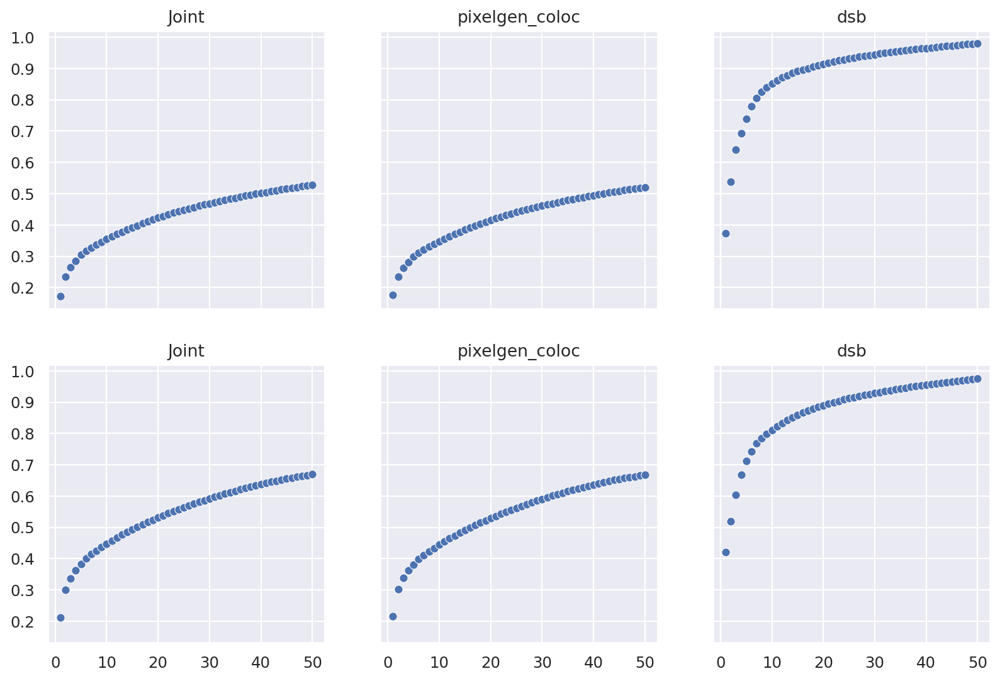

In [10]:
fig, ax = plt.subplots(2, 3, figsize=(12, 8), sharey=True, sharex=True)
for i, cur_adata in enumerate(joint_adatas):
    plot_cumulative_variance(cur_adata, pca_info_key='joint_pca_info', ax=ax[i][0], title='Joint')
    plot_cumulative_variance(cur_adata, pca_info_key=distr_pca_key + '_info', ax=ax[i][1], title=distr_key)
    plot_cumulative_variance(cur_adata, pca_info_key=counts_pca_key + '_info', ax=ax[i][2], title=counts_key)

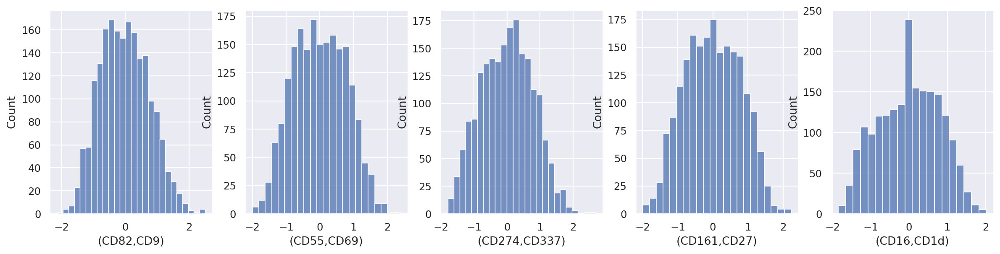

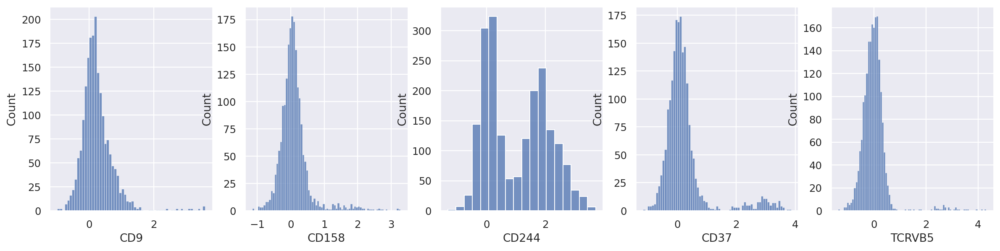

In [11]:
random_features_distr = np.random.choice(resting_joint_adata.obsm[distr_key].columns, 5)
random_features_counts = np.random.choice(resting_joint_adata.obsm[counts_key_in_joint].columns, 5) 

fig, axes = plt.subplots(1, 5, figsize=(18, 4))

for ax, feature in zip(axes, random_features_distr):
    sns.histplot(resting_joint_adata.obsm[distr_key][feature], ax=ax)

fig, axes = plt.subplots(1, 5, figsize=(18, 4))

for ax, feature in zip(axes, random_features_counts):
    sns.histplot(resting_joint_adata.obsm[counts_key_in_joint][feature], ax=ax)

Text(0.5, 0.98, 'Stim Joint')

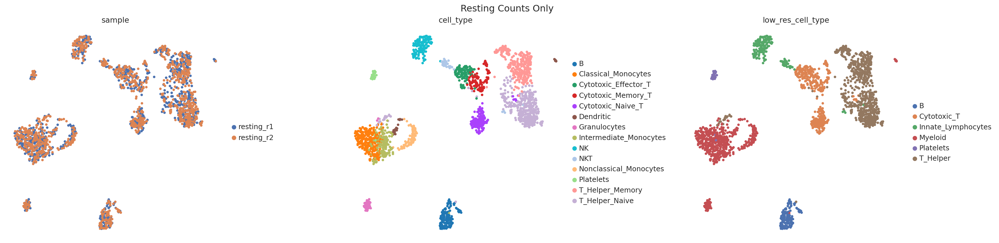

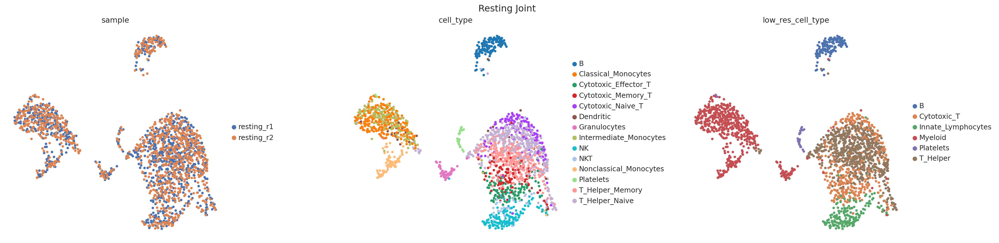

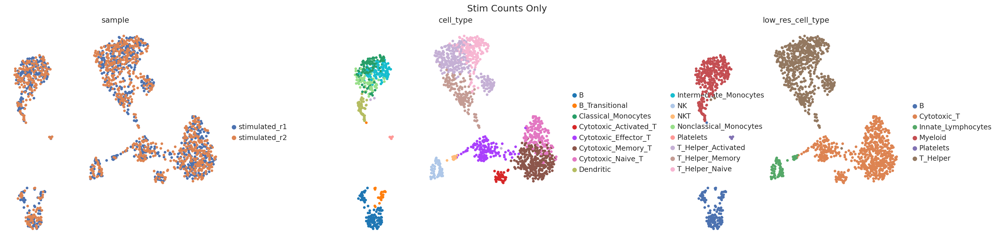

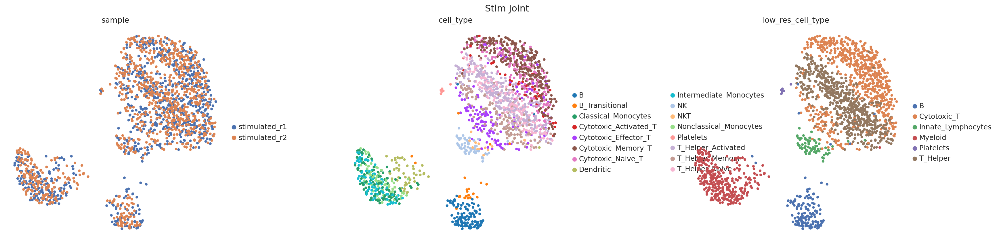

In [12]:
sc.tl.umap(resting_joint_adata, neighbors_key=counts_pca_key)
sc.pl.umap(resting_joint_adata, color=['sample', 'cell_type', 'low_res_cell_type'], wspace=0.4, return_fig=True).suptitle('Resting Counts Only')
sc.tl.umap(resting_joint_adata, neighbors_key=f'joint_pca')
sc.pl.umap(resting_joint_adata, color=['sample', 'cell_type', 'low_res_cell_type'], wspace=0.4, return_fig=True).suptitle('Resting Joint')

sc.tl.umap(stim_joint_adata, neighbors_key=counts_pca_key)
sc.pl.umap(stim_joint_adata, color=['sample', 'cell_type', 'low_res_cell_type'], wspace=0.4, return_fig=True).suptitle('Stim Counts Only')
sc.tl.umap(stim_joint_adata, neighbors_key=f'joint_pca')
sc.pl.umap(stim_joint_adata, color=['sample', 'cell_type', 'low_res_cell_type'], wspace=0.4, return_fig=True).suptitle('Stim Joint')


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/10000 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Monitored metric elbo_validation did not improve in the last 100 records. Best score: 2597.189. Signaling Trainer to stop.


/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 100 records. Best score: 26.683. Signaling Trainer to stop.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/10000 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Monitored metric elbo_validation did not improve in the last 100 records. Best score: 2299.534. Signaling Trainer to stop.


/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.10/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 100 records. Best score: 31.003. Signaling Trainer to stop.


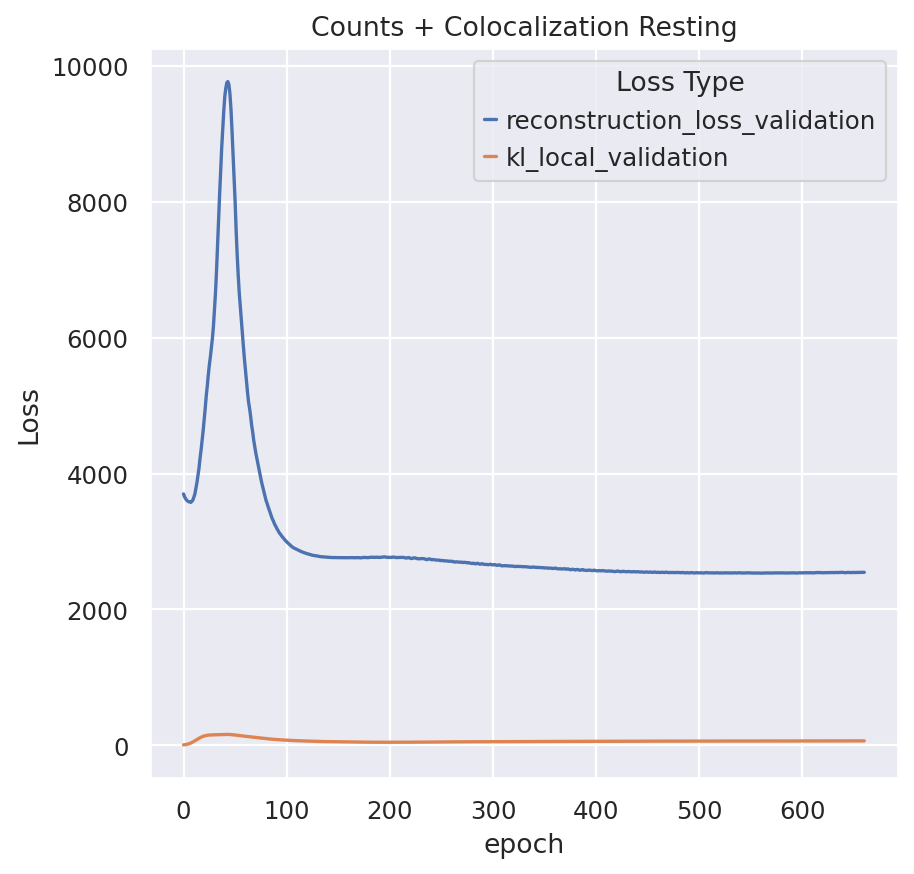

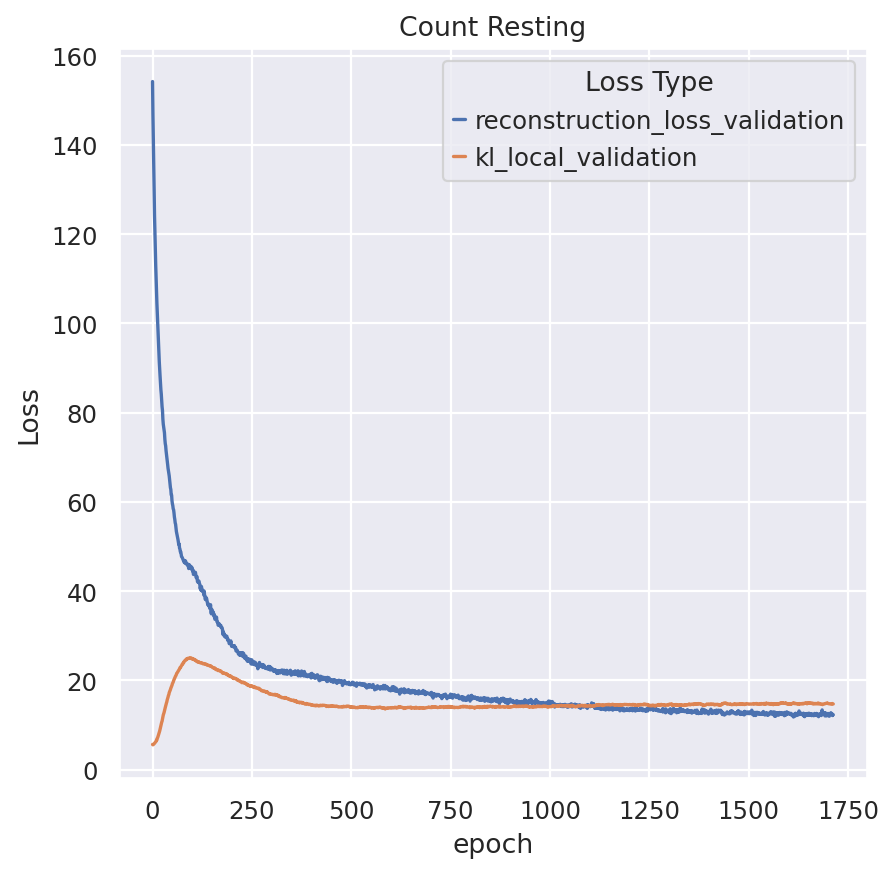

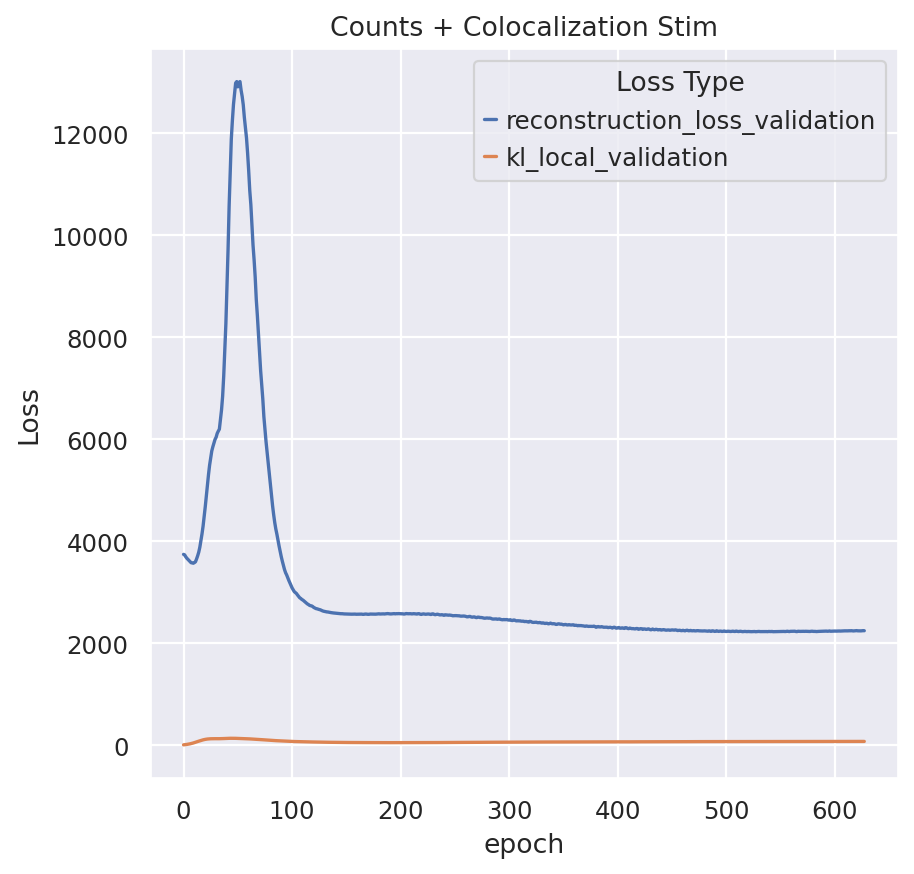

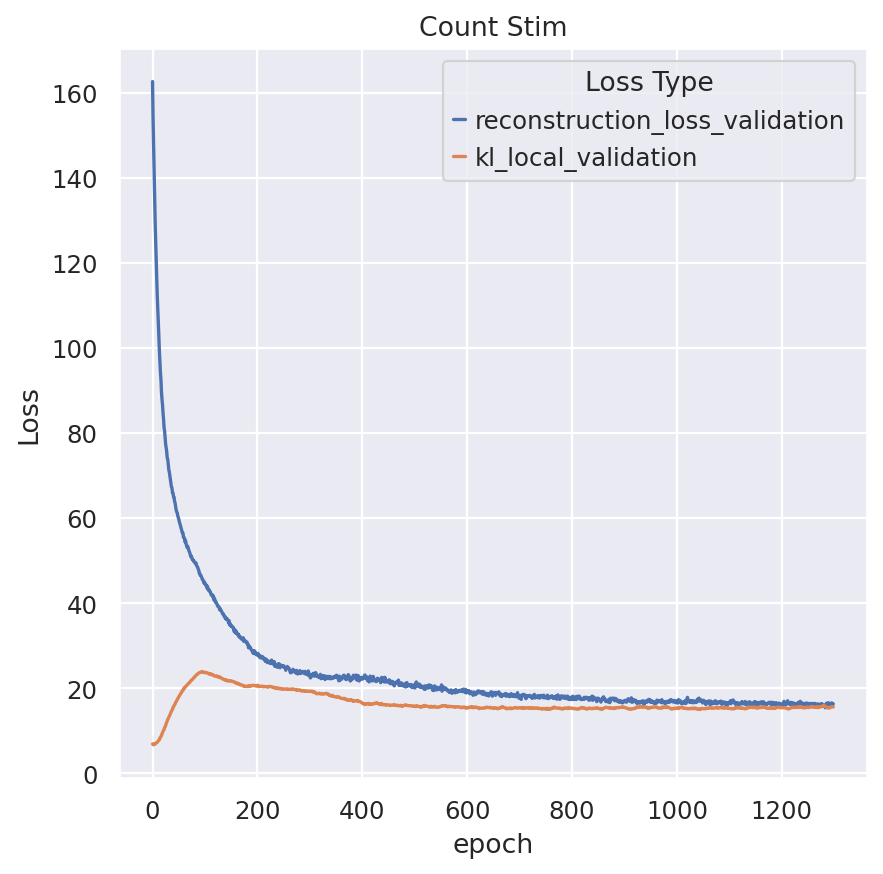

In [13]:
joint_models = []
count_models = []

load_models = False
# joint_model_paths = ['/home/labs/nyosef/eitangr/pixelgen/PixelGen/models/25_01_2025__14_28_19/resting_counts_and_polarization', 
#                      '/home/labs/nyosef/eitangr/pixelgen/PixelGen/models/25_01_2025__14_28_19/stim_counts_and_polarization']
# count_model_paths = ['/home/labs/nyosef/eitangr/pixelgen/PixelGen/models/25_01_2025__14_28_19/resting_dsb',
#                      '/home/labs/nyosef/eitangr/pixelgen/PixelGen/models/25_01_2025__14_28_19/stim_dsb'
# ]

if load_models:
    joint_models = [model_cls.load(p) for p in joint_model_paths]
    count_models = [model_cls.load(p) for p in count_model_paths]

else:

    for cur_joint_adata, cur_count_adata, name in zip((resting_joint_adata, stim_joint_adata), (resting_adata, stim_adata), ('Resting', 'Stim')):
        model_cls.setup_anndata(cur_joint_adata, batch_key='sample',)
        joint_model = model_cls(cur_joint_adata, **joint_model_kwargs)
        joint_model.train(**train_kwargs)
        ax = plot_validation_loss(joint_model, semilogy=False)
        ax.set_title(f'{joint_name} {name}')
        joint_models.append(joint_model)

        model_cls.setup_anndata(cur_count_adata, layer=counts_key, batch_key='sample',)
        count_model = model_cls(cur_count_adata, **counts_model_kwargs)
        count_model.train(**train_kwargs)
        ax = plot_validation_loss(count_model, semilogy=False)
        ax.set_title(f'Count {name}')
        count_models.append(count_model)

resting_joint_model, stim_joint_model = joint_models
resting_counts_only_model, stim_counts_only_model = count_models

In [61]:
# Uncomment to save
from pathlib import Path
# BASE_PATH = Path('/home/labs/nyosef/eitangr/pixelgen/PixelGen/models')

# resting_joint_model.save(f'')

In [15]:
for cur_adata, cur_coloc_model, cur_counts_model in zip(joint_adatas, joint_models, count_models):

    cur_adata.obsm[joint_key_scvi_latent] = cur_coloc_model.get_latent_representation()
    cur_adata.obsm[counts_key_scvi_latent] = cur_counts_model.get_latent_representation()


    sc.pp.neighbors(cur_adata, n_neighbors=15, use_rep=joint_key_scvi_latent, key_added=joint_key_scvi_latent)
    sc.pp.neighbors(cur_adata, n_neighbors=15, use_rep=counts_key_scvi_latent, key_added=counts_key_scvi_latent)

    N_PCS = (20, 50)

    latent_keys = [joint_key_scvi_latent, counts_key_scvi_latent]
    latent_names = [f'{joint_name} SCVI', 'Counts SCVI']
    latent_n_pcs_lst = [None, None]
    neighbors_keys = [joint_key_scvi_latent, counts_key_scvi_latent]

    for n_pcs in N_PCS:
        for latent in (joint_pca_key, counts_pca_key, distr_pca_key):
            latent_pcs_name = f'{latent}_{n_pcs}_PCs'
            n_pcs_clipped = min(n_pcs, cur_adata.obsm[distr_pca_key].shape[1])
            sc.pp.neighbors(cur_adata, n_neighbors=15, n_pcs=n_pcs_clipped, use_rep=latent, key_added=latent_pcs_name)
            latent_keys.append(latent)
            latent_names.append(latent_pcs_name)
            latent_n_pcs_lst.append(n_pcs)
            neighbors_keys.append(latent_pcs_name)

In [37]:
# resting_pairs_marginals_corr = pairs_to_marginals_correlation(resting_joint_adata.to_df(layer='counts_and_coloc_raw'), marker_names=MARKER_NAMES)
# stim_pairs_marginals_corr = pairs_to_marginals_correlation(stim_joint_adata.to_df(layer='counts_and_coloc_raw'), marker_names=MARKER_NAMES)
# fig, ax = plt.subplots(1)
# pair_marginals_corr = pd.concat((resting_pairs_marginals_corr, stim_pairs_marginals_corr), axis=1, keys=['resting', 'stim']).melt()
# sns.boxplot(pair_marginals_corr, y='value', ax=ax, hue='variable')
# ax.set_title('Pair - Marginal Multiple Variable Correlation R^2')

# resting_joint_adata.uns['pairs_marginals_corr'] = resting_pairs_marginals_corr
# stim_joint_adata.uns['pairs_marginals_corr'] = stim_pairs_marginals_corr

In [38]:
# top_uncorr_pairs = 5
# vars = resting_joint_adata.uns['pairs_marginals_corr'].sort_values(ascending=True)[:top_uncorr_pairs].index

# fig, ax = plt.subplots(1, top_uncorr_pairs, figsize=(20, 4))
# for i, var in enumerate(vars):
#     sns.histplot(resting_joint_adata.to_df()[var], ax=ax[i])
# sns.histplot(resting_joint_adata.to_df()['(CD41,CD40)'], ax=plt.subplots(1)[1])
# sns.histplot(resting_joint_model.get_normalized_expression(library_size='latent')['(CD41,CD82)'], ax=plt.subplots(1)[1])

In [39]:
# top_uncorr_pairs = 500
# recons_MSE = (resting_joint_adata.to_df() - resting_joint_model.get_normalized_expression(library_size='latent')).pow(2).mean(axis=0)
# resting_joint_adata.var['is_pair'] = ~ resting_joint_adata.var.index.isin(MARKER_NAMES)
# vars = resting_joint_adata.uns['pairs_marginals_corr'].sort_values(ascending=True)[:top_uncorr_pairs].index

# resting_joint_adata.var['type'] = resting_joint_adata.var['is_pair'].map({True: 'corr_pair', False: 'marginal'})
# resting_joint_adata.var['type'] = resting_joint_adata.var['type'].where(~ (resting_joint_adata.var['is_pair'] & resting_joint_adata.var.index.isin(vars)), 'uncorr_pair')

# recons_MSE = pd.DataFrame({'MSE': recons_MSE, 'var_type': resting_joint_adata.var['type']})
# sns.boxplot(recons_MSE, y='MSE', hue='var_type')


In [ ]:
# top_uncorr_pairs = 500
for cur_joint_adata, name, cur_coloc_model in zip(joint_adatas, ('Resting','Stim'), joint_models):
        # vars = cur_joint_adata.uns['pairs_marginals_corr'].sort_values(ascending=True)[:top_uncorr_pairs].index
        vars = None
        autocorr = distr_autocorrelation_in_latent(cur_joint_adata,
                latent_neighbors_connectivities_key_lst=[f'{n_key}_connectivities' for n_key in neighbors_keys],
                names=latent_names,
                distr_key=distr_key, vars=vars,
                )

        autocorr_melt = pd.melt(autocorr, id_vars=['latent'], value_vars=['morans', 'gearys'], value_name='Score', var_name='Metric')

        fig, ax = plt.subplots(1, figsize=(12, 4))
        sns.boxplot(autocorr_melt, x='latent', y='Score', hue='Metric', ax=ax)
        fig.suptitle(name)
        fig.tight_layout()

        fig, ax = plt.subplots(1, 2, figsize=(15,4))
        autocorr_agg = autocorr.groupby('latent', as_index=False)[['morans', 'gearys']].agg(['mean', 'median']).set_index('latent').stack(level=1, future_stack=True).reset_index().rename(columns={'level_1': 'Agg'})

        sns.scatterplot(autocorr_agg, x='morans', y='gearys', ax=ax[0], hue='latent', style='Agg')
        ax[0].set_title('Autocorrelation Scores')
        # ax[1].set_title('Median Score')
        # fig.tight_layout()
        # ax[0].legend('')
        ax[0].legend(bbox_to_anchor=(-0.4, 0.75), )
        fig.suptitle(name)

        # print(name)
        # corr = latent_to_distr_correlation(cur_joint_adata, latent_key_lst=latent_keys, n_pcs_lst=latent_n_pcs_lst, names=latent_names, distr_key=distr_key, vars=vars,)
        # print(corr)

        recons_MSE = (cur_joint_adata.to_df() - cur_coloc_model.get_normalized_expression(sample=False)).pow(2).mean(axis=0)
        cur_joint_adata.var['is_marker'] = cur_joint_adata.var.index.isin(MARKER_NAMES)
        cur_joint_adata.var['type'] = cur_joint_adata.var['is_marker'].map({True: 'marker', False: distr_key})
        # cur_joint_adata.var['type'] = cur_joint_adata.var['type'].where(~ (cur_joint_adata.var['is_pair'] & cur_joint_adata.var.index.isin(vars)), 'uncorr_pair')
        recons_MSE = pd.DataFrame({'MSE': recons_MSE, 'var_type': cur_joint_adata.var['type']})
        # fig, ax = plt.subplots(1, figsize=(6,4))
        sns.boxplot(recons_MSE, y='MSE', hue='var_type', ax=ax[1])
        # fig.suptitle(name)
        ax[1].set_title(f'Reconstruction MSE')
        fig.tight_layout()


        sc.tl.umap(cur_joint_adata, neighbors_key=counts_key_scvi_latent)
        sc.pl.umap(cur_joint_adata, color=['sample', 'low_res_cell_type', 'cell_type'], wspace=0.4, return_fig=True).suptitle('Counts Only - SCVI Latent')
        sc.tl.umap(cur_joint_adata, neighbors_key=joint_key_scvi_latent)
        sc.pl.umap(cur_joint_adata, color=['sample', 'low_res_cell_type', 'cell_type'], wspace=0.4, return_fig=True).suptitle(f'{joint_name} - SCVI Latent')

        bm = Benchmarker(
                cur_joint_adata,
                batch_key="sample",
                label_key="low_res_cell_type",
                bio_conservation_metrics=BioConservation(),
                batch_correction_metrics=BatchCorrection(),
                embedding_obsm_keys=[joint_pca_key, counts_pca_key, joint_key_scvi_latent, counts_key_scvi_latent],
                n_jobs=1,
        )
        bm.benchmark()
        bm.plot_results_table(min_max_scale=False)


/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
Computing neighbors:   0%|          | 0/4 [00:00<?, ?it/s]

In [73]:
import hotspot
hs = hotspot.Hotspot(
    cur_adata,
    layer_key=joint_key,
    model='none',
    latent_obsm_key=joint_key_scvi_latent,
    umi_counts_obs_key=None,
)

ValueError: 
Detected all zero genes. Please filter adata and reinitialize.

Text(0.5, 0.98, 'Counts + Colocalization - SCVI Latent')

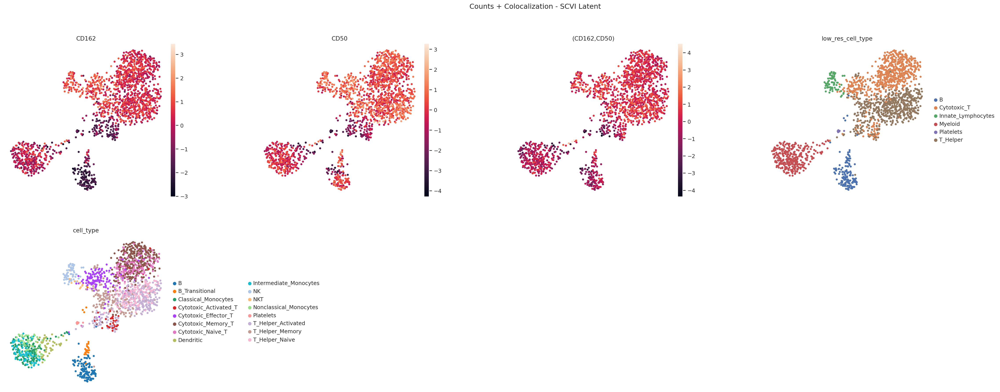

In [71]:
sc.pl.umap(cur_joint_adata, color=['CD162', 'CD50', '(CD162,CD50)', 'low_res_cell_type', 'cell_type'], wspace=0.4, return_fig=True).suptitle(f'{joint_name} - SCVI Latent')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training:   0%|          | 0/10000 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 100 records. Best score: 79.525. Signaling Trainer to stop.


Text(0.5, 0.98, 'Resting Counts (DSB) - Normal SCVI Latent')

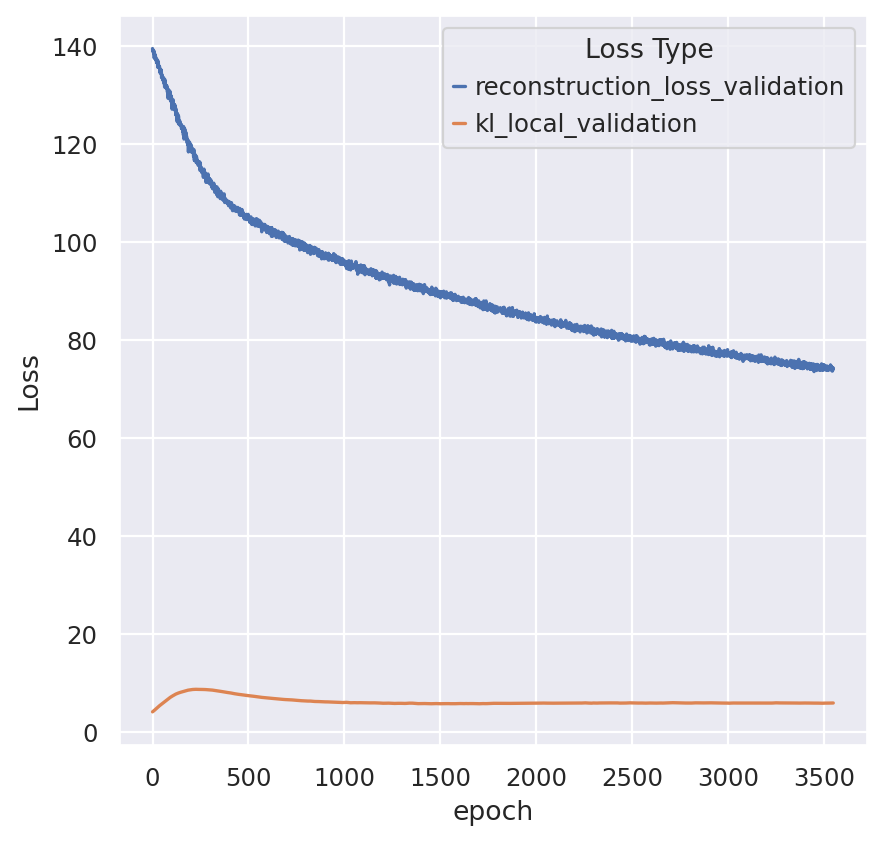

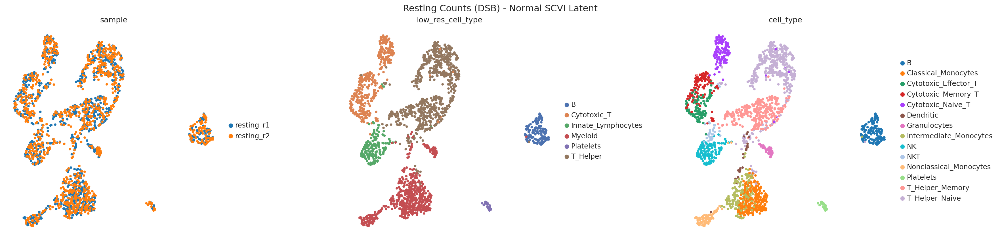

In [17]:
from scvi.model import SCVI

CLS = NormalSCVI

integer_counts_model_kwargs = dict(n_latent=25, n_hidden=128, n_layers=1, dropout_rate=0.05)
integer_counts_train_kwargs = dict(train_size=0.8, check_val_every_n_epoch=1, early_stopping=True, early_stopping_patience=100, batch_size=2000,
                    max_epochs=10000, enable_checkpointing=True, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=100))

CLS.setup_anndata(resting_adata, layer='dsb', batch_key='sample',)
# integer_count_model = CLS(resting_adata, gene_likelihood='normal', dispersion='gene', latent_distribution='normal', **integer_counts_model_kwargs)
integer_count_model = CLS(resting_adata, **integer_counts_model_kwargs)

integer_count_model.train(**integer_counts_train_kwargs)
ax = plot_validation_loss(integer_count_model, semilogy=False)
# ax.set_title(f'Count {name}')
resting_adata.obsm['integer_counts_scvi'] = integer_count_model.get_latent_representation()
sc.pp.neighbors(resting_adata, use_rep='integer_counts_scvi', key_added='integer_counts_scvi')
sc.tl.umap(resting_adata, neighbors_key='integer_counts_scvi')
sc.pl.umap(resting_adata, color=['sample', 'low_res_cell_type', 'cell_type'], wspace=0.4, return_fig=True).suptitle(f'Resting Counts (DSB) - Normal SCVI Latent')



Text(0.5, 0.98, 'Resting Counts - ZINB SCVI Latent')

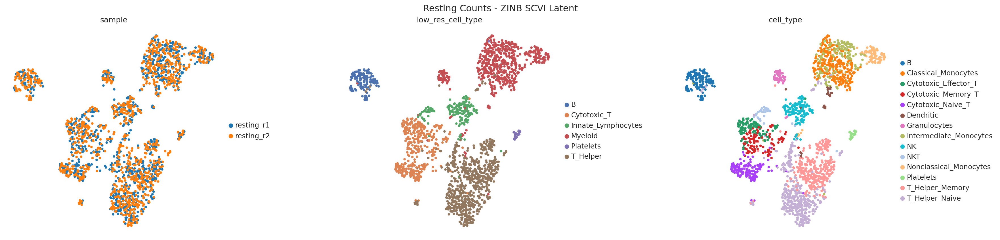

<Axes: xlabel='morans', ylabel='gearys'>

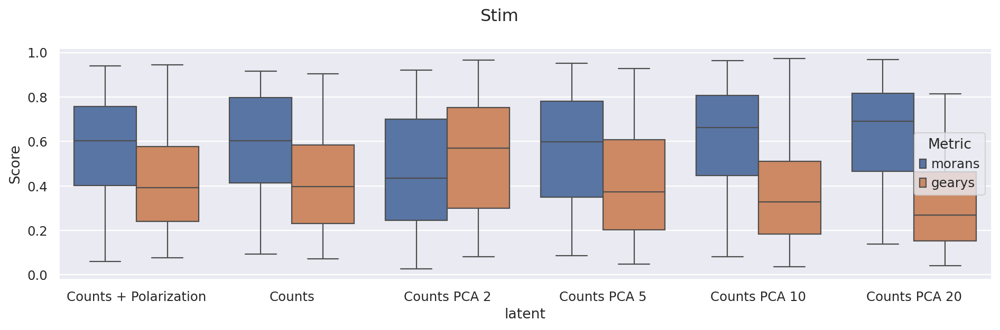

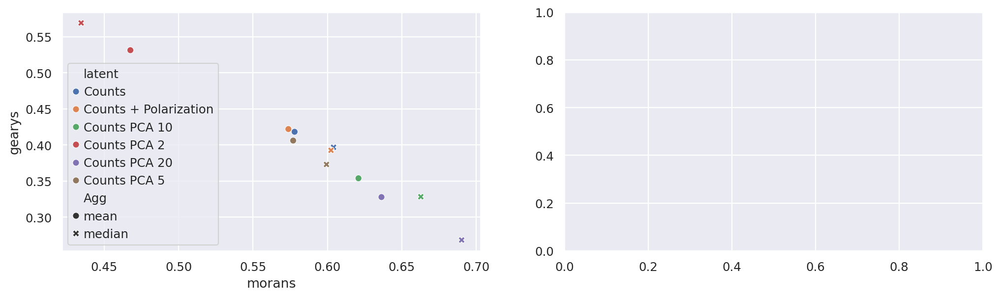

In [28]:
autocorr = distr_autocorrelation_in_latent(cur_joint_adata,
                latent_neighbors_connectivities_key_lst=[f'{n_key}_connectivities' for n_key in neighbors_keys],
                names=latent_names,
                distr_key='counts_dsb', vars=vars,
                )

autocorr_melt = pd.melt(autocorr, id_vars=['latent'], value_vars=['morans', 'gearys'], value_name='Score', var_name='Metric')

fig, ax = plt.subplots(1, figsize=(12, 4))
sns.boxplot(autocorr_melt, x='latent', y='Score', hue='Metric', ax=ax)
fig.suptitle(name)
fig.tight_layout()

fig, ax = plt.subplots(1, 2, figsize=(15,4))
autocorr_agg = autocorr.groupby('latent', as_index=False)[['morans', 'gearys']].agg(['mean', 'median']).set_index('latent').stack(level=1, future_stack=True).reset_index().rename(columns={'level_1': 'Agg'})

sns.scatterplot(autocorr_agg, x='morans', y='gearys', ax=ax[0], hue='latent', style='Agg')

In [90]:
from datetime import datetime

print(datetime.now().strftime("%d_%m_%Y__%H_%M_%S"))

25_01_2025__14_25_20


In [116]:
from datetime import datetime
from pathlib import Path 

BASE_PATH = Path('/home/labs/nyosef/eitangr/pixelgen/PixelGen/models')

now = datetime.now().strftime("%d_%m_%Y__%H_%M_%S")

resting_joint_model.save(BASE_PATH / now / f'resting_{joint_key}', save_anndata=True)
resting_counts_only_model.save(BASE_PATH / now / f'resting_{counts_key}', save_anndata=True)
stim_joint_model.save(BASE_PATH / now / f'stim_{joint_key}', save_anndata=True)
stim_counts_only_model.save(BASE_PATH / now / f'stim_{counts_key}', save_anndata=True)

In [ ]:
for latent_key in ('counts_scvi_latent', 'counts_and_coloc_scvi_latent'):
    print(f"{latent_key}: {latent_to_distr_correlation(resting_joint_adata, latent_key=latent_key, distr_key='coloc_clr',) : .2f}")
for n_pcs in N_PCS:
    print(f"PCA (n_pcs={n_pcs}): {latent_to_distr_correlation(resting_joint_adata, latent_key=latent_key, distr_key='coloc_clr', n_pcs=n_pcs) : .2f}")

counts_scvi_latent:  0.66
counts_and_coloc_scvi_latent:  0.75
PCA (n_pcs=2):  0.42
PCA (n_pcs=5):  0.46
PCA (n_pcs=20):  0.75


In [ ]:
de_df = significant_hits_by_cluster_size(resting_joint_adata, neighbors_key_lst=['neighbors_counts_scvi', 'neighbors_counts_and_coloc_scvi'] + \
                                         [f'neighbors_counts_pca_{n_pcs}' for n_pcs in N_PCS], latent_name_lst=['Counts', 'Counts+Coloc'] + [f'PCA {n_pcs}' for n_pcs in N_PCS],
                                         distr_key='coloc_clr',
                                         )

In [14]:
pair_marginals_corr.melt()

,variable,value
0,resting,0.939634
1,resting,0.957338
2,resting,0.936365
3,resting,0.841498
4,resting,0.828672
...,...,...
11095,stim,0.751501
11096,stim,0.453565
11097,stim,0.848360
11098,stim,0.293395


Text(0.5, 1.0, 'Pair - Marginal Multiple Variable Correlation R^2')

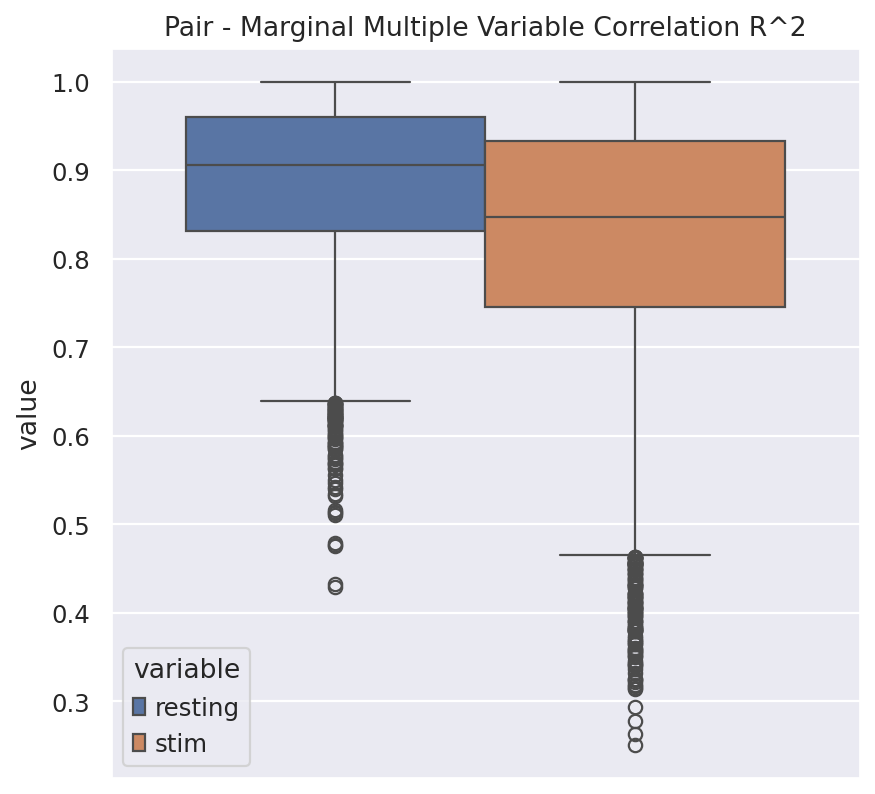

In [46]:
pairs_count_corr.sort_values(ascending=True)[500]

/tmp/ipykernel_812894/1178339267.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pairs_count_corr.sort_values(ascending=True)[500]


0.7484487001072494

<Axes: xlabel='n_clusters', ylabel='n_significant_hits'>

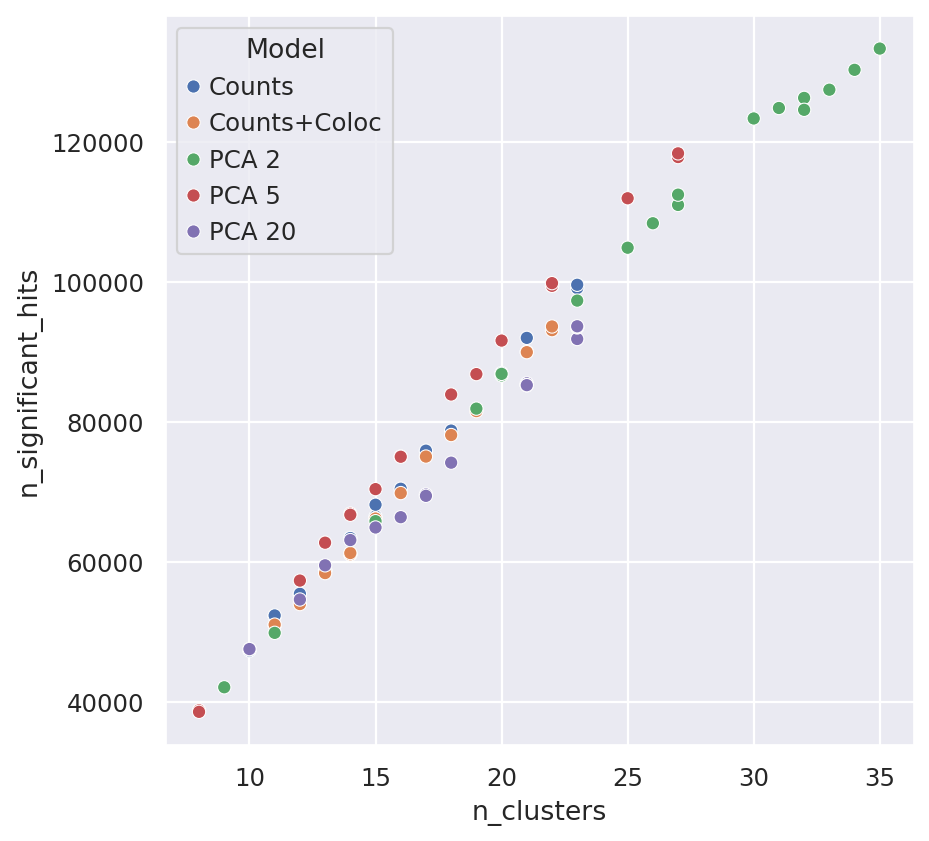

In [24]:
sns.scatterplot(de_df, x='n_clusters', y='n_significant_hits', hue='Model')

In [ ]:
coloc_adata = anndata.AnnData(
    X=adata.obsm['marker_counts_and_pair_coloc'], 
    obs=adata.obs, 
    obsm={'counts': adata.layers['counts'], 'counts_clr': adata.layers['clr'], 'marker_pair_coloc': adata.obsm['marker_pair_coloc']},
    uns = {
        'neighbors_counts_clr_both_samples': adata.uns['neighbors'],
        'leiden_counts_clr_both_samples': adata.uns['leiden'],   
    }
)

coloc_adata.obs.rename(columns={'leiden': 'leiden_counts_clr_both_samples'}, inplace=True)

resting_joint_adata = coloc_adata[coloc_adata.obs[coloc_adata.obs['sample_class'] == 'resting'].index, :].copy()
stim_joint_adata = coloc_adata[coloc_adata.obs[coloc_adata.obs['sample_class'] == 'stimulated'].index, :].copy()


sc.pp.highly_variable_genes(
    resting_joint_adata,
    n_top_genes=2000,
    flavor="seurat_v3",
    inplace=True,
    batch_key="sample",
)
# hvg_resting_coloc_adata = resting_coloc_adata[:, resting_coloc_adata.var[resting_coloc_adata.var['highly_variable']].index].copy()
hvg_resting_coloc_adata = resting_joint_adata.copy()

# hvg_coloc_adata = coloc_adata

# print(coloc_adata.var[coloc_adata.var['highly_variable']])
# hvg_coloc_adata = coloc_adata


In [8]:
marker_pair_str_names = [pair2str(p[0], p[1]) for p in adata.uns['coloc_info']['marker_diff_pair_tuples']]
coloc_adata.var['is_pair'] = coloc_adata.var.index.isin(marker_pair_str_names)
hvg_resting_coloc_adata.var['is_pair'] = hvg_resting_coloc_adata.var.index.isin(marker_pair_str_names)

<Axes: xlabel='means', ylabel='variances_norm'>

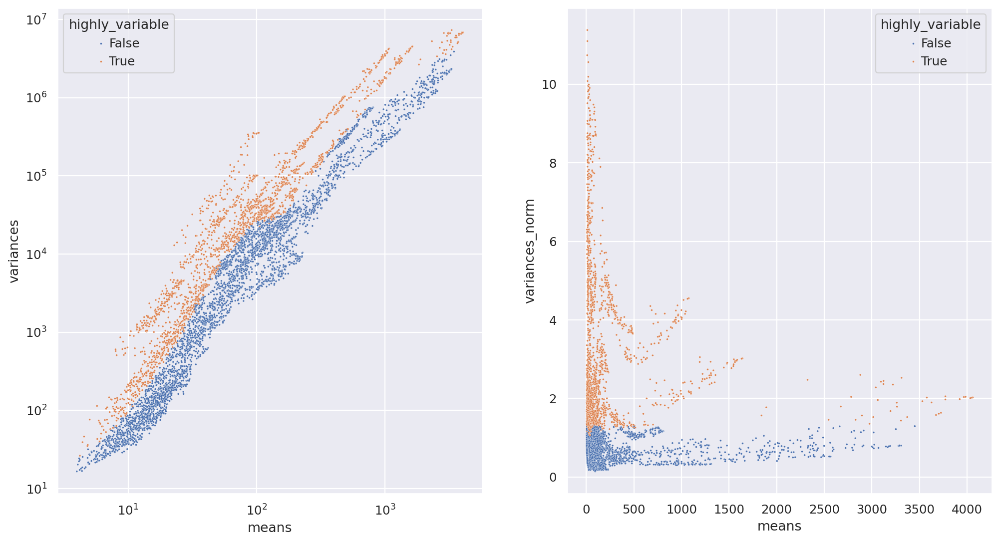

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
sns.scatterplot(x=resting_joint_adata.var['means'], y=resting_joint_adata.var['variances'], s=3, ax=ax[0], hue=resting_joint_adata.var['highly_variable'])
ax[0].loglog()

sns.scatterplot(x=resting_joint_adata.var['means'], y=resting_joint_adata.var['variances_norm'], s=3, ax=ax[1], hue=resting_joint_adata.var['highly_variable'])
# sns.scatterplot(x=resting_coloc_adata.var['means'], y=resting_coloc_adata.var['variances'], s=3, ax=ax[1])

In [10]:
coloc_adata.to_df().head(5)

,B2M,CD102,CD11a,CD11b,CD11c,CD14,CD150,CD152,CD154,CD158,...,"(mIgG2b,CD8)","(mIgG2b,CD82)","(mIgG2b,CD84)","(mIgG2b,CD86)","(mIgG2b,CD9)","(mIgG2b,HLA-ABC)","(mIgG2b,HLA-DR)","(mIgG2b,TCRVB5)","(mIgG2b,mIgG1)","(mIgG2b,mIgG2a)"
component,,,,,,,,,,,,,,,,,,,,,
RCVCMP0000000_resting_r1,4690,349,509,81,679,50,23,13,31,33,...,7,10,11,13,7,15,15,5,5,3
RCVCMP0000001_resting_r1,3379,94,262,156,50,78,105,21,34,78,...,12,11,8,8,9,11,10,5,9,3
RCVCMP0000002_resting_r1,3070,39,202,58,35,42,30,17,36,29,...,12,17,14,8,14,17,17,12,13,14
RCVCMP0000004_resting_r1,2014,26,63,92,18,19,27,14,16,25,...,5,7,4,3,6,8,3,5,1,2
RCVCMP0000005_resting_r1,6731,227,240,185,112,79,134,66,60,101,...,22,31,15,11,23,32,22,12,8,16


In [11]:
counts_adata = pg_data.adata
counts_adata.X = counts_adata.layers['counts']
resting_counts_adata = counts_adata[counts_adata.obs[counts_adata.obs['sample_class'] == 'resting'].index, :].copy()
stim_counts_adata = counts_adata[counts_adata.obs[counts_adata.obs['sample_class'] == 'stimulated'].index, :].copy()

/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_elem from `anndata.experimental` is deprecated. Import anndata.io.read_elem instead.
  warnings.warn(msg, FutureWarning)


In [12]:
counts_adata.to_df().head(5)

marker,B2M,CD102,CD11a,CD11b,CD11c,CD14,CD150,CD152,CD154,CD158,...,CD84,CD86,CD9,HLA-ABC,HLA-DR,TCRVB5,ACTB,mIgG1,mIgG2a,mIgG2b
component,,,,,,,,,,,,,,,,,,,,,
RCVCMP0000000_resting_r1,4690,349,509,81,679,50,23,13,31,33,...,30,262,68,1961,763,19,67,14,22,15
RCVCMP0000001_resting_r1,3379,94,262,156,50,78,105,21,34,78,...,39,16,38,1215,61,15,71,24,22,12
RCVCMP0000002_resting_r1,3070,39,202,58,35,42,30,17,36,29,...,35,18,40,1395,2871,26,48,17,31,17
RCVCMP0000004_resting_r1,2014,26,63,92,18,19,27,14,16,25,...,53,15,69,758,35,18,31,13,15,8
RCVCMP0000005_resting_r1,6731,227,240,185,112,79,134,66,60,101,...,89,72,172,2066,267,65,179,46,82,44


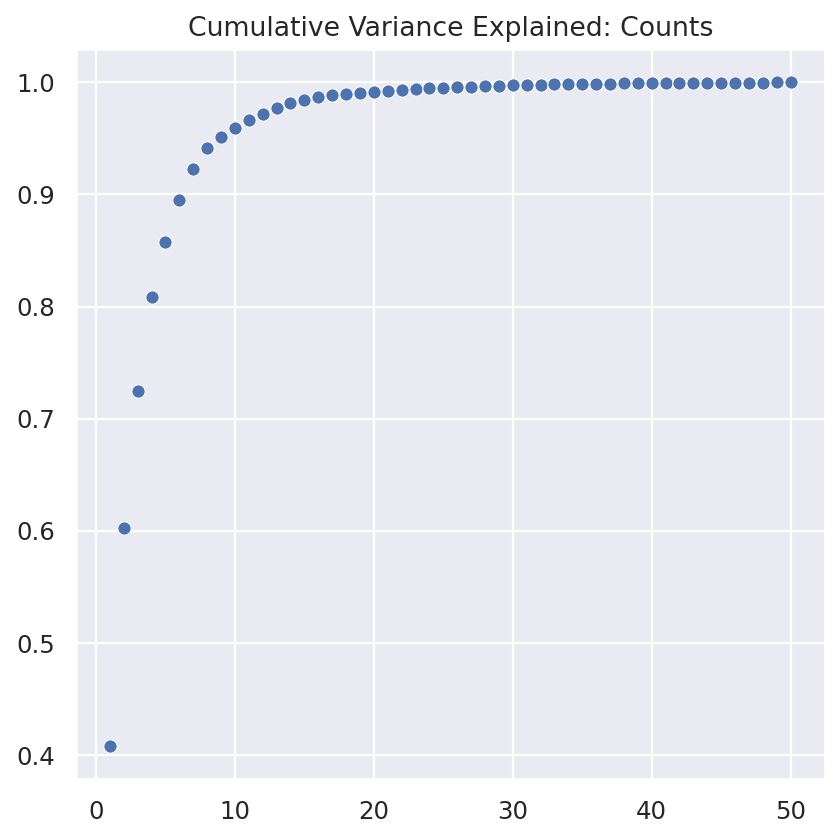

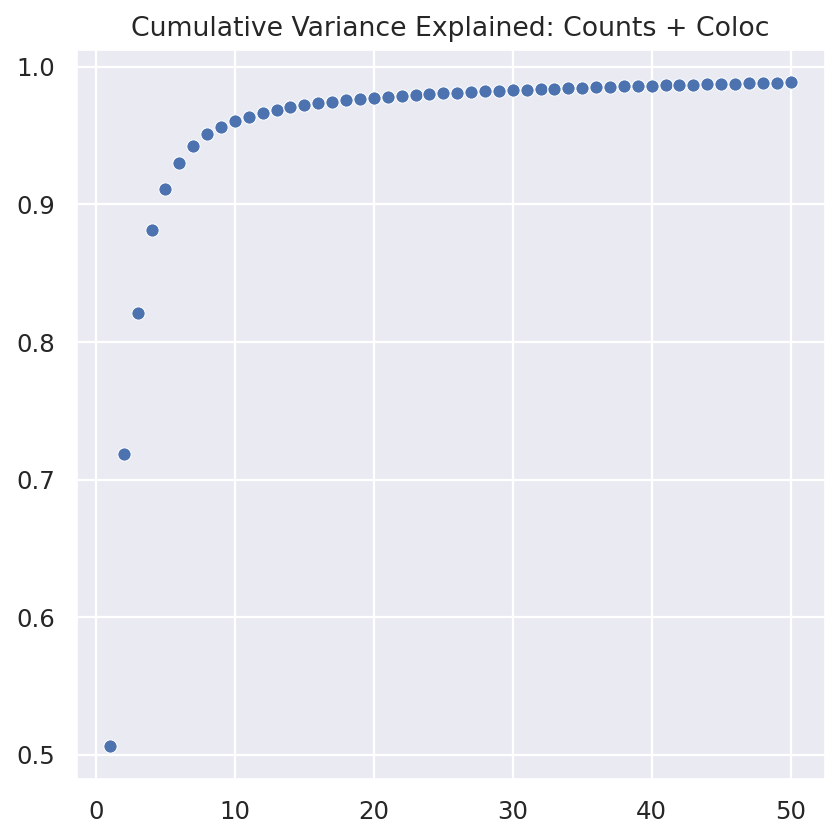

In [13]:
for current_adata in (resting_counts_adata, hvg_resting_coloc_adata):
    n_pcs = 50
    sc.tl.pca(current_adata)
    # sc.pl.pca_variance_ratio(current_adata, n_pcs=n_pcs, log=True)

    fig_intersection, ax = plt.subplots(1)
    var_ratio_accum = np.cumsum(current_adata.uns['pca']['variance_ratio'])
    sns.scatterplot(x=list(range(1, n_pcs + 1)), y=var_ratio_accum, markers=[f'$PC{i}$' for i in range(1, n_pcs + 1)])
    ax.set_title(f'Cumulative Variance Explained: {"Counts" if current_adata is resting_counts_adata else "Counts + Coloc"}')

/tmp/ipykernel_1190334/589560470.py:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(current_adata, resolution=1, random_state=0, key_added=leiden_key, flavor='leidenalg', neighbors_key=neighbors_key)


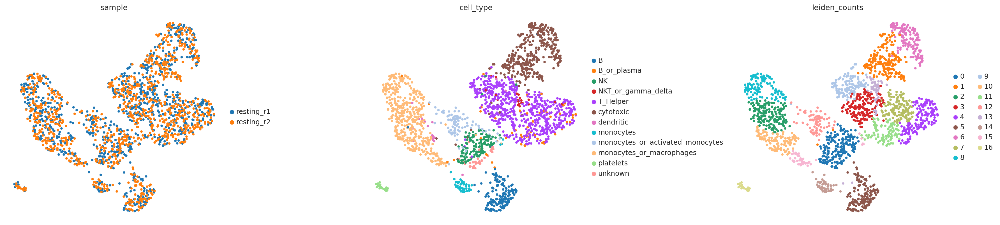

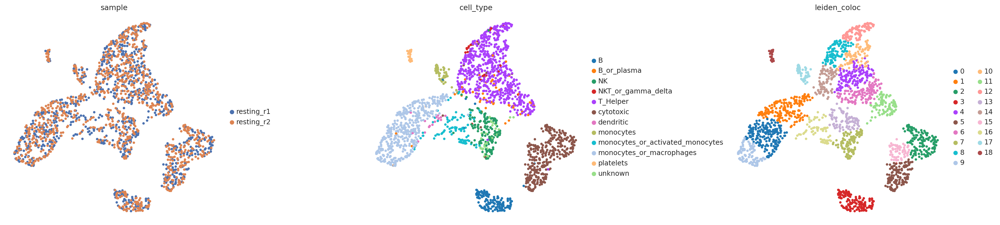

In [14]:
for current_adata in (resting_counts_adata, hvg_resting_coloc_adata):
    neighbors_key = 'neighbors_counts' if current_adata is resting_counts_adata else 'neighbors_coloc'
    leiden_key = 'leiden_counts' if current_adata is resting_counts_adata else 'leiden_coloc'
    sc.pp.neighbors(current_adata, n_neighbors=15, random_state=0, key_added=neighbors_key)
    sc.tl.leiden(current_adata, resolution=1, random_state=0, key_added=leiden_key, flavor='leidenalg', neighbors_key=neighbors_key)
    sc.tl.umap(current_adata, neighbors_key=neighbors_key)
    sc.pl.umap(current_adata, color=['sample', 'cell_type', leiden_key,], wspace=0.5)

In [15]:
scvi.model.SCVI.setup_anndata(resting_counts_adata, batch_key='sample',)

resting_counts_model = scvi.model.SCVI(resting_counts_adata, n_hidden=128, n_layers=2, dispersion='gene-cell', gene_likelihood='zinb', latent_distribution='normal')
resting_counts_model.train(train_size=0.8, check_val_every_n_epoch=1, early_stopping=50, max_epochs=400, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=200))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 45 records. Best score: 349.837. Signaling Trainer to stop.


[]

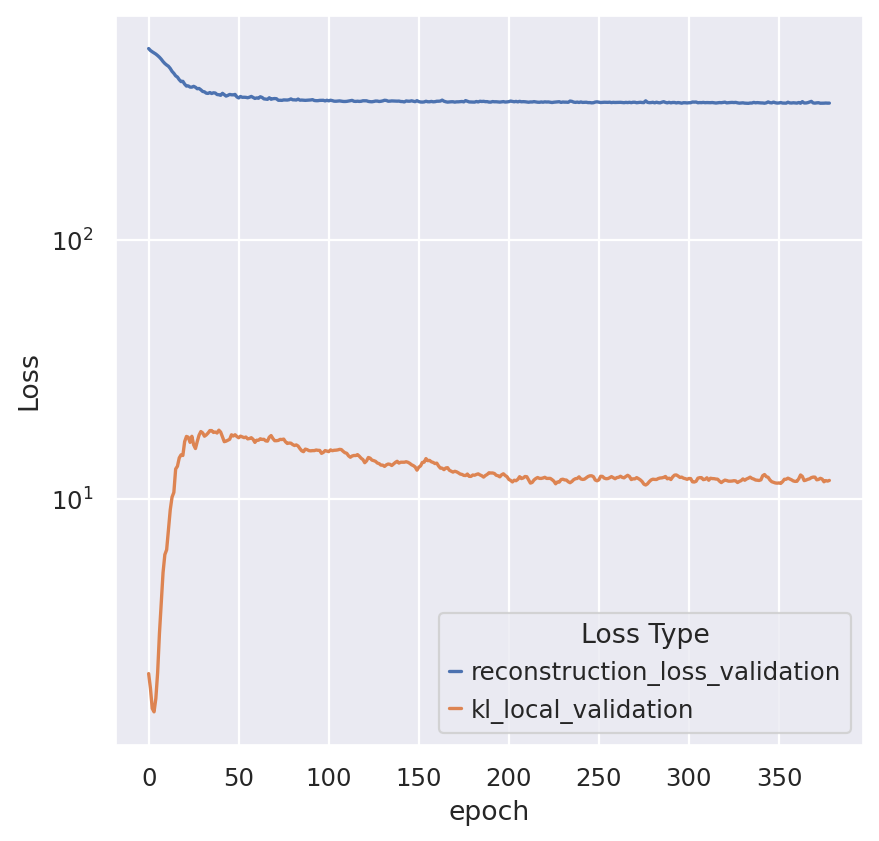

In [16]:
n_epochs = len(resting_counts_model.history['validation_loss'])
validation_losses = ['reconstruction_loss_validation', 'kl_local_validation']
validation_df = pd.melt(pd.DataFrame({l: resting_counts_model.history[l][l] for l in validation_losses}).reset_index(), id_vars=['epoch'], value_name='Loss', var_name='Loss Type')
sns.lineplot(validation_df, x='epoch', y='Loss', hue='Loss Type')
plt.semilogy()

In [ ]:
scvi.model.SCVI.setup_anndata(hvg_resting_coloc_adata, batch_key='sample',)

resting_joint_model = scvi.model.SCVI(hvg_resting_coloc_adata, n_hidden=128, n_layers=2, dispersion='gene-cell', gene_likelihood='zinb', latent_distribution='normal')
resting_joint_model.train(train_size=0.8, check_val_every_n_epoch=1, early_stopping=50, max_epochs=400, plan_kwargs=dict(lr=3e-4, optimizer='Adam', n_epochs_kl_warmup=200))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 45 records. Best score: 23698.078. Signaling Trainer to stop.


[]

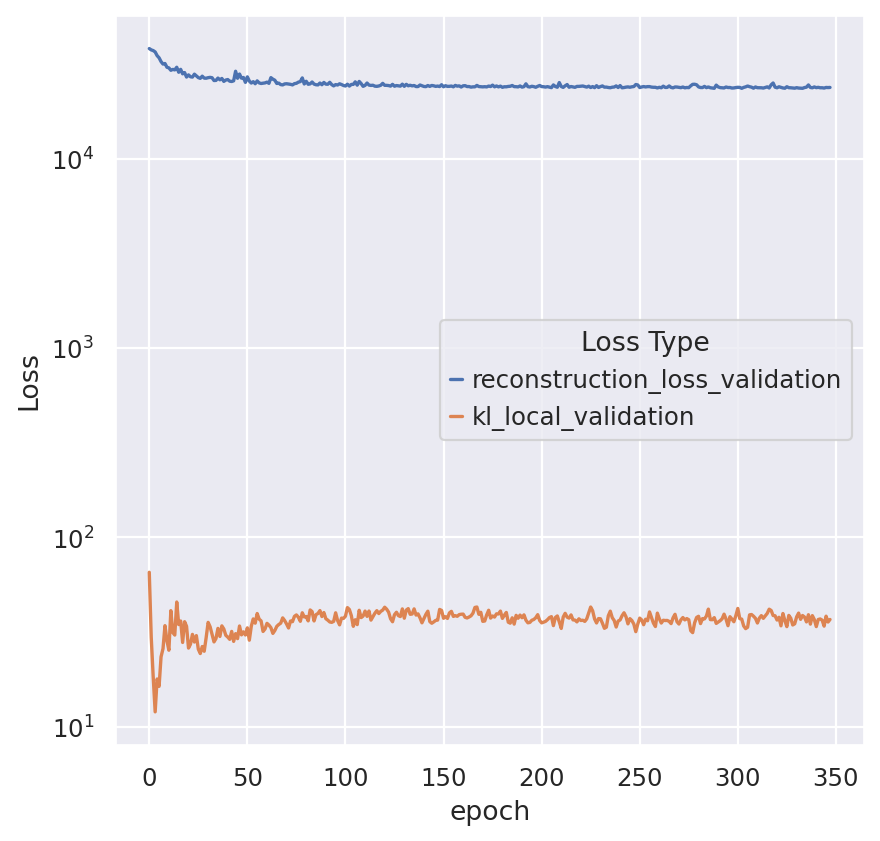

In [ ]:
n_epochs = len(resting_joint_model.history['validation_loss'])
validation_losses = ['reconstruction_loss_validation', 'kl_local_validation']
validation_df = pd.melt(pd.DataFrame({l: resting_joint_model.history[l][l] for l in validation_losses}).reset_index(), id_vars=['epoch'], value_name='Loss', var_name='Loss Type')
sns.lineplot(validation_df, x='epoch', y='Loss', hue='Loss Type')
plt.semilogy()

### Compute neighbors in new latent space
And measure euclidean distance in the coloc distribution space between neighbors in the latent space

In [19]:
def coloc_distribution_distance(obs1_index, obs2_index, pairs_only_coloc_adata):
    i1, i2 = obs1_index, obs2_index
    return np.linalg.norm(pairs_only_coloc_adata.X[i1] - pairs_only_coloc_adata.X[i2])

In [20]:
pairs_only_coloc_adata = hvg_resting_coloc_adata[:, hvg_resting_coloc_adata.var['is_pair'].index]
pairs_only_coloc_adata.layers['log1p'] = np.log1p(pairs_only_coloc_adata.X)

/tmp/ipykernel_1190334/2206037226.py:2: ImplicitModificationWarning: Setting element `.layers['log1p']` of view, initializing view as actual.
  pairs_only_coloc_adata.layers['log1p'] = np.log1p(pairs_only_coloc_adata.X)


In [ ]:
correlations = []

for model_type in ('Counts', 'Counts+Coloc'):
    current_adata  = resting_counts_adata if model_type == 'Counts' else hvg_resting_coloc_adata
    model = resting_counts_model if model_type == 'Counts' else resting_joint_model
    for n_neighbors in tqdm(range(5, 21)):
        neighbors_key = f'neighbors_counts_scvi_{n_neighbors}' if model_type == 'Counts' else f'neighbors_coloc_scvi_{n_neighbors}'
        current_adata.obsm['scvi_latent'] = model.get_latent_representation()
        sc.pp.neighbors(current_adata, n_neighbors=n_neighbors, random_state=0, use_rep='scvi_latent', key_added=neighbors_key)

        neighbors_row, neighbors_col = current_adata.obsp[f'{neighbors_key}_distances'].nonzero()
        obs1 = pairs_only_coloc_adata.X[neighbors_row, :]
        obs2 = pairs_only_coloc_adata.X[neighbors_col, :]

        coloc_distance_data = np.linalg.norm(obs1 - obs2, axis=1)
        n_obs = len(current_adata.obs.index)
        current_adata.obsp[f'{neighbors_key}_distance_in_coloc_space'] = scipy.sparse.csr_matrix((coloc_distance_data, (neighbors_row, neighbors_col)), shape=(n_obs, n_obs))
    
        latent_distance_data = current_adata.obsp[f'{neighbors_key}_distances'].data

        correlations.append(
            {
                'Model': model_type,
                'n_neighbors': n_neighbors,
                'Correlation': scipy.stats.pearsonr(coloc_distance_data, latent_distance_data)[0]
             }
        )

correlations = pd.DataFrame(correlations)

# sc.tl.leiden(current_adata, resolution=1, random_state=0, key_added=leiden_key, flavor='leidenalg', neighbors_key=neighbors_key)
# sc.tl.umap(current_adata, neighbors_key=neighbors_key)

100%|██████████| 16/16 [00:13<00:00,  1.15it/s]


### Global Correlation between distance between neighboring points in latent space, and distance between same points in raw co-localization features

This is a sort of sanity check, as the counts + coloc model was trained to reconstruct the coloc data, so the latent space should reflect that.

Text(0.5, 0, 'Neighbors per Point')

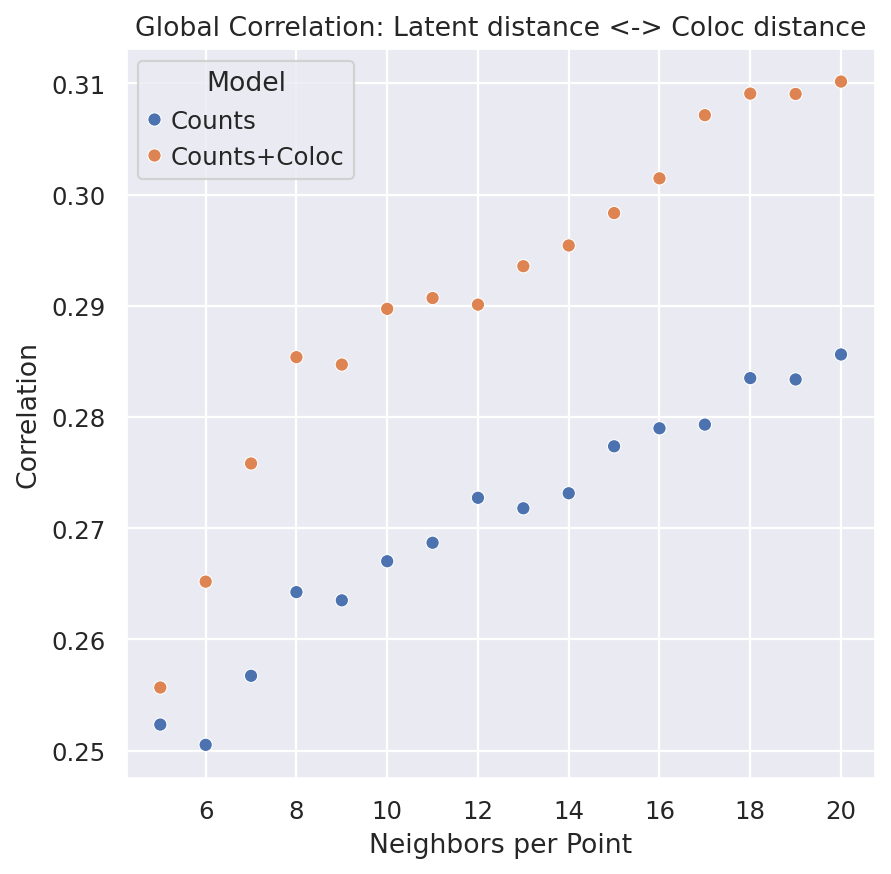

In [26]:
ax = sns.scatterplot(correlations, x='n_neighbors', y='Correlation', hue='Model')
ax.set_title('Global Correlation: Latent distance <-> Coloc distance')
ax.set_xlabel('Neighbors per Point')

### Compute Differential Expression of Marker Pairs Between Clusters of Different Resolution

In [23]:
current_adata.uns[leiden_key]

{'params': {'resolution': 1, 'random_state': 0, 'n_iterations': -1}}

In [24]:
# Use n_neighbors=15 as a default for computing clusters

de = []

for model_type in ('Counts', 'Counts+Coloc'):
    current_adata = resting_counts_adata if model_type == 'Counts' else hvg_resting_coloc_adata
    neighbors_key = 'neighbors_counts_scvi_15' if model_type == 'Counts' else 'neighbors_coloc_scvi_15'
    resolution_range = np.arange(0.2, 2, 0.1)
    for r in tqdm(resolution_range):
        leiden_key = f'leiden_counts_scvi_{r:.1f}'if model_type == 'Counts' else f'leiden_coloc_scvi_{r:.1f}'
        de_key = f'de_counts_{r:.1f}' if model_type == 'Counts' else f'de_coloc_{r:.1f}'
        sc.tl.leiden(current_adata, resolution=r, random_state=0, n_iterations=-1, key_added=leiden_key, flavor='leidenalg', neighbors_key=neighbors_key, copy=False)

        # Drop if already exists (when rerunning)
        pairs_only_coloc_adata.obs.drop(columns=[leiden_key,], inplace=True, errors='ignore')

        pairs_only_coloc_adata.obs = pairs_only_coloc_adata.obs.join(current_adata.obs[leiden_key])
        pairs_only_coloc_adata.uns[leiden_key] = current_adata.uns[leiden_key]
        pairs_only_coloc_adata.uns[leiden_key]['n_clusters'] = n_clusters = current_adata.obs[leiden_key].nunique()
        sc.tl.rank_genes_groups(pairs_only_coloc_adata, layer='log1p', groupby=leiden_key, method='wilcoxon', key_added=de_key)
        significant_hits_df = sc.get.rank_genes_groups_df(pairs_only_coloc_adata, group=None, key=de_key, pval_cutoff=0.05)
        de.append(
            {
                'Model': model_type,
                'n_clusters': n_clusters,
                'resolution': r,
                'n_significant_hits' : len(significant_hits_df)
            }
        )

de_df = pd.DataFrame(de)

 72%|███████▏  | 13/18 [00:24<00:10,  2.04s/it]/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/labs/nyosef/

Text(0.5, 1.0, 'Significant Hits in DE of Coloc vs n_clusters')

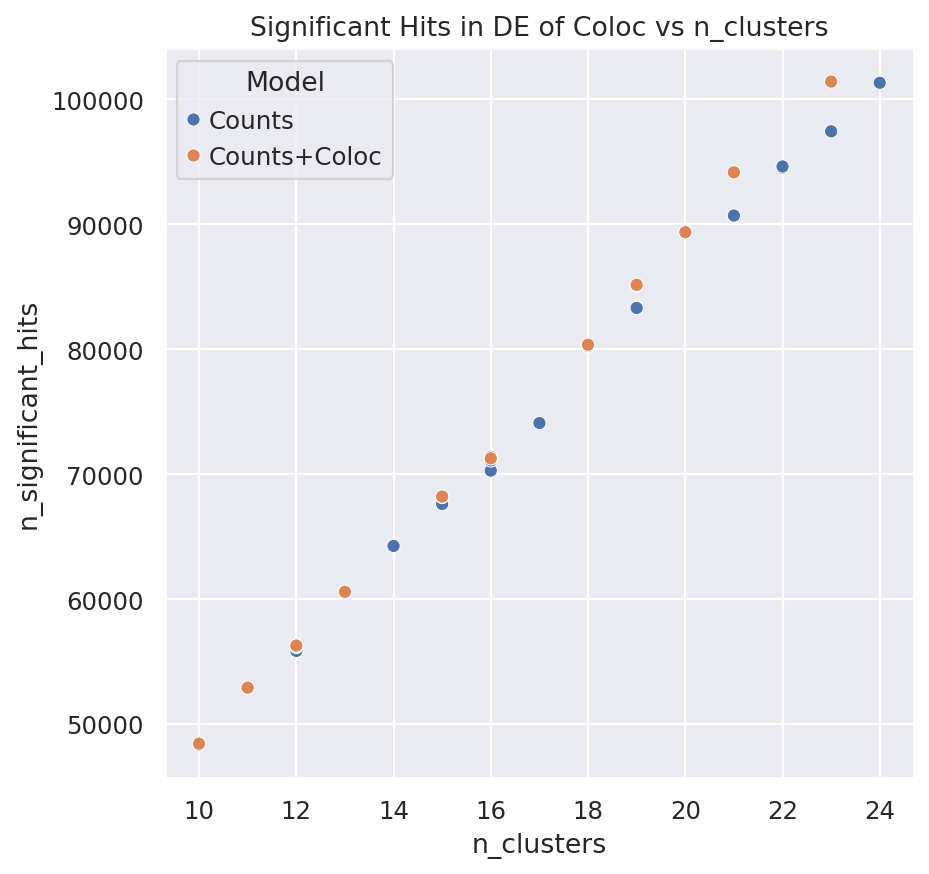

In [25]:
ax = sns.scatterplot(de_df, x='n_clusters', y='n_significant_hits', hue='Model')
ax.set_title('Significant Hits in DE of Coloc vs n_clusters')

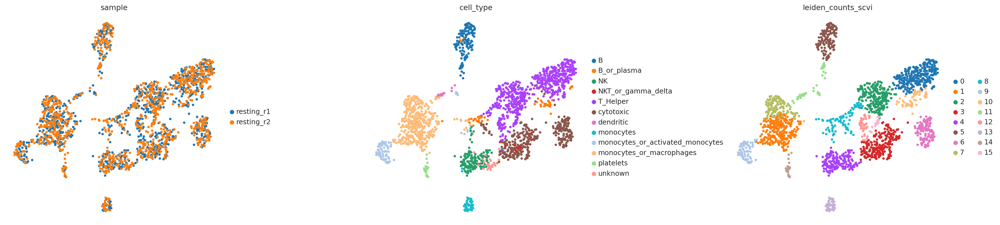

In [ ]:
# resting_counts_adata.obsm['scvi_latent'] = resting_counts_model.get_latent_representation()
# sc.pp.neighbors(resting_counts_adata, n_neighbors=15, random_state=0, use_rep='scvi_latent', key_added='neighbors_counts_scvi')
# sc.tl.leiden(resting_counts_adata, resolution=1, random_state=0, key_added='leiden_counts_scvi', flavor='leidenalg', neighbors_key='neighbors_counts_scvi')
# sc.tl.umap(resting_counts_adata, neighbors_key='neighbors_counts_scvi')
# sc.pl.umap(resting_counts_adata, color=['sample', 'cell_type', 'leiden_counts_scvi',], wspace=0.5)

In [ ]:
# scvi.model.SCVI.setup_anndata(resting_coloc_adata, batch_key='sample',)

# resting_coloc_model = scvi.model.SCVI(resting_coloc_adata, n_hidden=128, n_layers=2, dispersion='gene-cell', gene_likelihood='zinb', latent_distribution='normal')
# resting_coloc_model.train(train_size=0.8, check_val_every_n_epoch=1, early_stopping=50, plan_kwargs=dict(lr=3e-4, optimizer='Adam'))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]


Detected KeyboardInterrupt, attempting graceful shutdown ...


NameError: name 'exit' is not defined

<Axes: xlabel='epoch', ylabel='Loss'>

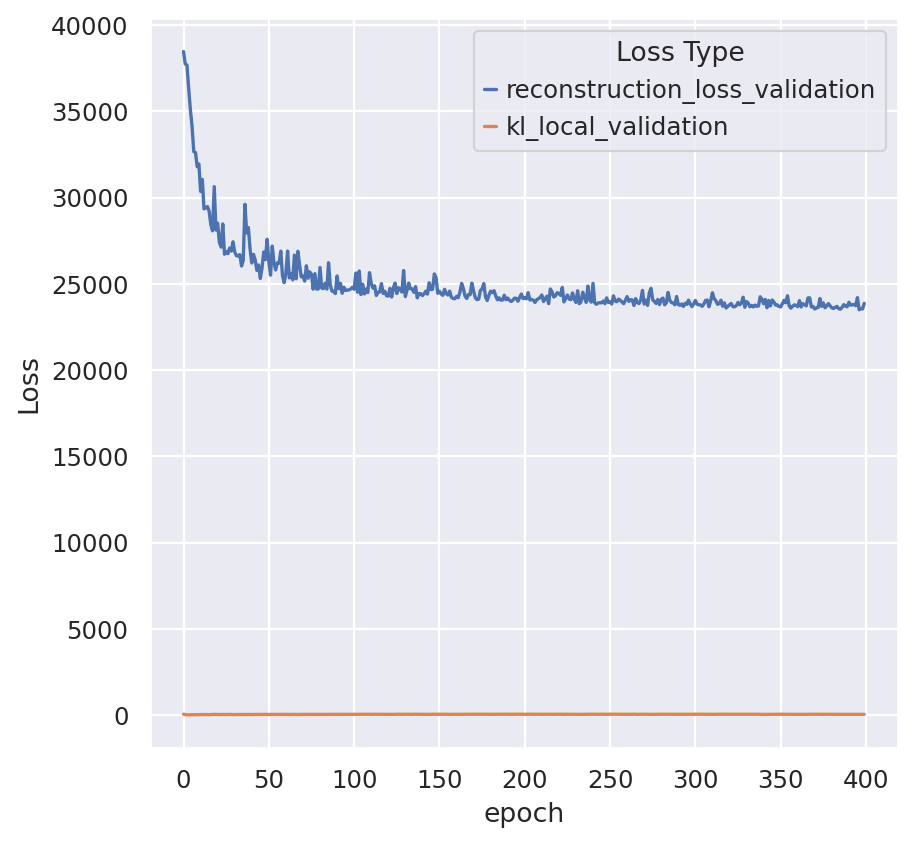

In [ ]:
# n_epochs = len(resting_coloc_model.history['validation_loss'])
# validation_losses = ['reconstruction_loss_validation', 'kl_local_validation']
# validation_df = pd.melt(pd.DataFrame({l: resting_coloc_model.history[l][l] for l in validation_losses}).reset_index(), id_vars=['epoch'], value_name='Loss', var_name='Loss Type')
# sns.lineplot(validation_df, x='epoch', y='Loss', hue='Loss Type')

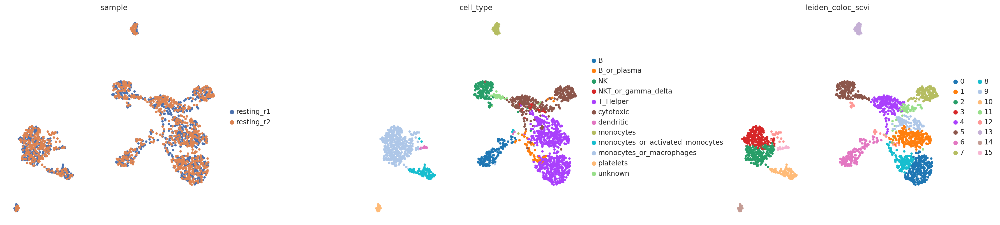

In [ ]:
# resting_coloc_adata.obsm['scvi_latent'] = resting_coloc_model.get_latent_representation()
# sc.pp.neighbors(resting_coloc_adata, n_neighbors=15, random_state=0, use_rep='scvi_latent', key_added='neighbors_coloc_scvi')
# sc.tl.leiden(resting_coloc_adata, resolution=1, random_state=0, key_added='leiden_coloc_scvi', flavor='leidenalg', neighbors_key='neighbors_coloc_scvi')
# sc.tl.umap(resting_coloc_adata, neighbors_key='neighbors_coloc_scvi')
# sc.pl.umap(resting_coloc_adata, color=['sample', 'cell_type', 'leiden_coloc_scvi',], wspace=0.5)

### Finished here

In [ ]:
# Compute leiden for resting sample only, based on the counts clr data

resting_counts_adata = adata[adata.obs[adata.obs['sample_class'] == 'resting'].index, :].copy()
sc.pp.neighbors(resting_counts_adata, n_neighbors=15, random_state=0, key_added='neighbors_counts_clr_resting')
sc.tl.leiden(resting_counts_adata, resolution=1, random_state=0, key_added='leiden_counts_clr_resting', flavor='leidenalg', neighbors_key='neighbors_counts_clr_resting')

# Add it to coloc data
resting_joint_adata.obs['leiden_counts_clr_resting'] = resting_counts_adata.obs['leiden_counts_clr_resting']
resting_joint_adata.uns['neighbors_counts_clr_resting'] = resting_counts_adata.uns['neighbors_counts_clr_resting']

In [ ]:
n_pcs = 50
sc.tl.pca(resting_joint_adata)
sc.pl.pca_variance_ratio(resting_joint_adata, n_pcs=n_pcs, log=True)

fig_intersection, ax = plt.subplots(1)
var_ratio_accum = np.cumsum(resting_joint_adata.uns['pca']['variance_ratio'])
sns.scatterplot(x=list(range(1, n_pcs + 1)), y=var_ratio_accum, markers=[f'$PC{i}$' for i in range(1, n_pcs + 1)])
ax.set_title('Cumulative Variance Explained')

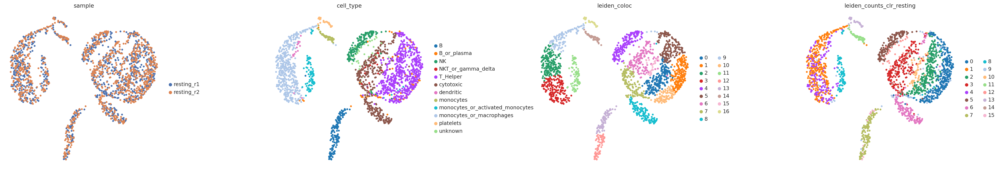

In [ ]:
sc.pp.neighbors(resting_joint_adata, n_neighbors=15, random_state=0, key_added='neighbors_coloc')
sc.tl.leiden(resting_joint_adata, resolution=1, random_state=0, key_added='leiden_coloc', flavor='leidenalg', neighbors_key='neighbors_coloc')
sc.tl.umap(resting_joint_adata, neighbors_key='neighbors_coloc')
sc.pl.umap(resting_joint_adata, color=['sample', 'cell_type', 'leiden_coloc', 'leiden_counts_clr_resting'], wspace=0.5)

In [ ]:
scvi.model.SCVI.setup_anndata(resting_joint_adata, batch_key='sample',)
# search_space = {
#     "model_params": {"n_hidden": tune.choice([64, 128, 256]), "n_layers": tune.choice([1, 2, 3]), "dispersion": 'gene-cell', 'gene_likelihood': 'zinb', 'latent_distribution': 'normal'},
#     "train_params": {"max_epochs": 400, "plan_kwargs": {"lr": 1e-4}, "early_stopping": 50, 'train_size': 0.8},
# }
# results = autotune.run_autotune(scvi.model.SCVI, data=resting_adata, mode='min', metrics='validation_loss', search_space=search_space, num_samples=10, resources={'cpu': 10,})

resting_model = scvi.model.SCVI(resting_joint_adata, n_hidden=128, n_layers=2, dispersion='gene-cell', gene_likelihood='zinb', latent_distribution='normal')
resting_model.train(train_size=0.8, check_val_every_n_epoch=1, early_stopping=50, plan_kwargs=dict(lr=3e-4, optimizer='Adam'))

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.
/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=255` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 45 records. Best score: 18979.963. Signaling Trainer to stop.


In [ ]:
# print(results.result_grid.get_dataframe()[['validation_loss', 'training_iteration', 'config/model_params/n_layers', 'config/model_params/n_hidden']].sort_values(by='validation_loss'))

<Axes: xlabel='epoch', ylabel='Loss'>

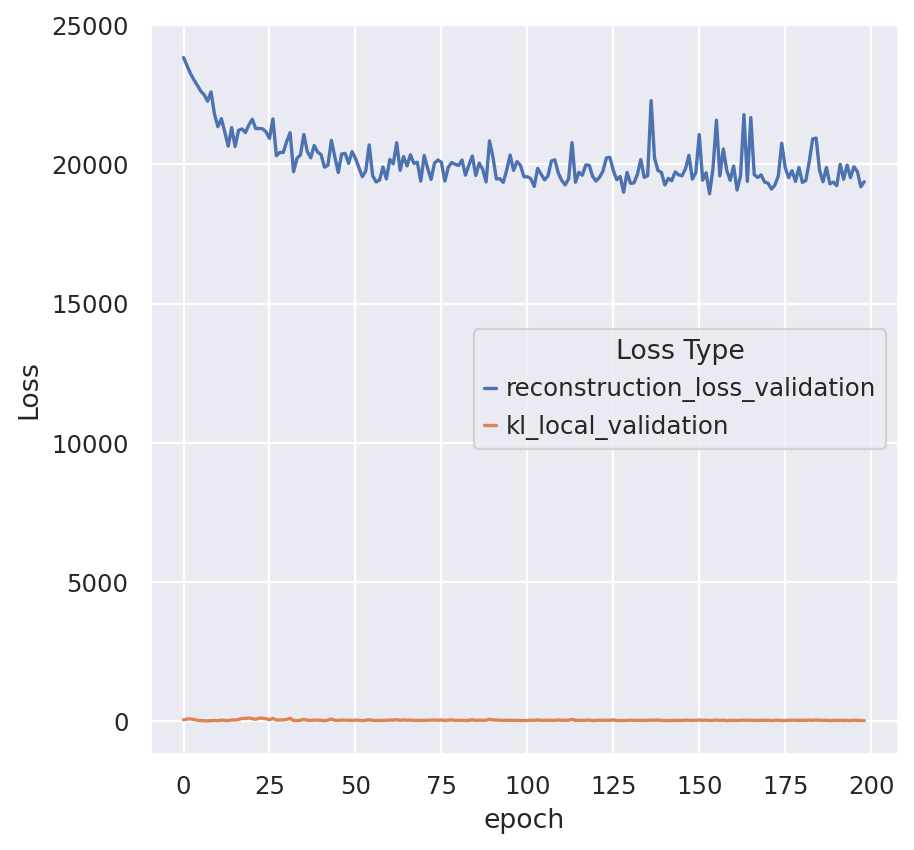

In [ ]:
n_epochs = len(resting_model.history['validation_loss'])
validation_losses = ['reconstruction_loss_validation', 'kl_local_validation']
# validation_losses = ['validation_loss', 'elbo_validation', 'reconstruction_loss_validation']
validation_df = pd.melt(pd.DataFrame({l: resting_model.history[l][l] for l in validation_losses}).reset_index(), id_vars=['epoch'], value_name='Loss', var_name='Loss Type')
sns.lineplot(validation_df, x='epoch', y='Loss', hue='Loss Type')

In [ ]:
resting_joint_adata.obsm['scvi_coloc_latent'] = resting_model.get_latent_representation()
sc.pp.neighbors(resting_joint_adata, n_neighbors=15, random_state=0, use_rep='scvi_coloc_latent', key_added='neighbors_scvi_coloc')
sc.tl.leiden(resting_joint_adata, resolution=1, random_state=0, key_added='leiden_scvi_coloc', neighbors_key='neighbors_scvi_coloc', flavor='leidenalg')

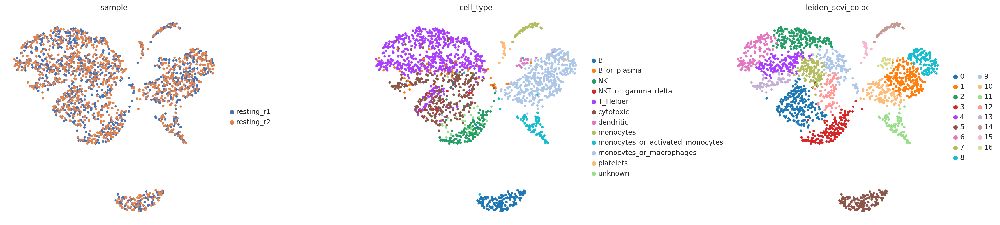

In [ ]:
sc.tl.umap(resting_joint_adata, neighbors_key='neighbors_scvi_coloc')
sc.pl.umap(resting_joint_adata, color=['sample', 'cell_type', 'leiden_scvi_coloc'], wspace=0.5)

In [ ]:
de_df = resting_model.differential_expression(
    groupby="cell_type",
)
de_df.columns

DE...:   0%|          | 0/12 [00:00<?, ?it/s]

Index(['proba_de', 'proba_not_de', 'bayes_factor', 'scale1', 'scale2',
       'pseudocounts', 'delta', 'lfc_mean', 'lfc_median', 'lfc_std', 'lfc_min',
       'lfc_max', 'raw_mean1', 'raw_mean2', 'non_zeros_proportion1',
       'non_zeros_proportion2', 'raw_normalized_mean1', 'raw_normalized_mean2',
       'is_de_fdr_0.05', 'comparison', 'group1', 'group2'],
      dtype='object')

In [ ]:
class PXLVI(BaseModuleClass):
    """Variational auto-encoder model for pixelgen data.

    Parameters
    ----------
    n_input
        Number of input genes.
    n_latent
        Dimensionality of the latent space.
    """

    def __init__(
        self,
        n_input: int,
        n_latent: int = 10,
    ):
        super().__init__()
        # in the init, we create the parameters of our elementary stochastic computation unit.

        # First, we setup the parameters of the generative model
        self.decoder = MyNeuralNet(n_latent, n_input, "softmax")
        self.log_theta = torch.nn.Parameter(torch.randn(n_input))

        # Second, we setup the parameters of the variational distribution
        self.mean_encoder = MyNeuralNet(n_input, n_latent, "none")
        self.var_encoder = MyNeuralNet(n_input, n_latent, "exp")

    def _get_inference_input(self, tensors: dict[str, torch.Tensor]) -> dict[str, torch.Tensor]:
        """Parse the dictionary to get appropriate args"""
        # let us fetch the raw counts, and add them to the dictionary
        return {"x": tensors[REGISTRY_KEYS.X_KEY]}

    @auto_move_data
    def inference(self, x: torch.Tensor) -> dict[str, torch.Tensor]:
        """
        High level inference method.

        Runs the inference (encoder) model.
        """
        # log the input to the variational distribution for numerical stability
        x_ = torch.log1p(x)
        # get variational parameters via the encoder networks
        qz_m = self.mean_encoder(x_)
        qz_v = self.var_encoder(x_)
        # get one sample to feed to the generative model
        # under the hood here is the Reparametrization trick (Rsample)
        z = Normal(qz_m, torch.sqrt(qz_v)).rsample()

        return {"qz_m": qz_m, "qz_v": qz_v, "z": z}

    def _get_generative_input(
        self, tensors: dict[str, torch.Tensor], inference_outputs: dict[str, torch.Tensor]
    ) -> dict[str, torch.Tensor]:
        return {
            "z": inference_outputs["z"],
            "library": torch.sum(tensors[REGISTRY_KEYS.X_KEY], dim=1, keepdim=True),
        }

    @auto_move_data
    def generative(self, z: torch.Tensor, library: torch.Tensor) -> dict[str, torch.Tensor]:
        """Runs the generative model."""
        # get the "normalized" mean of the negative binomial
        px_scale = self.decoder(z)
        # get the mean of the negative binomial
        px_rate = library * px_scale
        # get the dispersion parameter
        theta = torch.exp(self.log_theta)

        return {
            "px_scale": px_scale,
            "theta": theta,
            "px_rate": px_rate,
        }

    def loss(
        self,
        tensors: dict[str, torch.Tensor],
        inference_outputs: dict[str, torch.Tensor],
        generative_outputs: dict[str, torch.Tensor],
    ) -> LossOutput:
        # here, we would like to form the ELBO. There are two terms:
        #   1. one that pertains to the likelihood of the data
        #   2. one that pertains to the variational distribution
        # so we extract all the required information
        x = tensors[REGISTRY_KEYS.X_KEY]
        px_rate = generative_outputs["px_rate"]
        theta = generative_outputs["theta"]
        qz_m = inference_outputs["qz_m"]
        qz_v = inference_outputs["qz_v"]

        # term 1
        # the pytorch NB distribution uses a different parameterization
        # so we must apply a quick transformation (included in scvi-tools, but here we use the
        # pytorch code)
        nb_logits = (px_rate + 1e-4).log() - (theta + 1e-4).log()
        log_lik = NegativeBinomial(total_count=theta, logits=nb_logits).log_prob(x).sum(dim=-1)

        # term 2
        prior_dist = Normal(torch.zeros_like(qz_m), torch.ones_like(qz_v))
        var_post_dist = Normal(qz_m, torch.sqrt(qz_v))
        kl_divergence = kl(var_post_dist, prior_dist).sum(dim=1)

        elbo = log_lik - kl_divergence
        loss = torch.mean(-elbo)
        return LossOutput(
            loss=loss,
            reconstruction_loss=-log_lik,
            kl_local=kl_divergence,
            kl_global=0.0,
        )

In [ ]:
# search_space = {
#     "model_params": {"n_hidden": tune.choice([64, 128, 256]), "n_layers": tune.choice([1, 2, 3]), "dispersion": 'gene-cell', 'gene_likelihood': 'zinb', 'latent_distribution': 'normal'},
#     "train_params": {"max_epochs": 400, "plan_kwargs": {"lr": 1e-4}, "early_stopping": 50, 'train_size': 0.8},
# }
# results = autotune.run_autotune(scvi.model.SCVI, data=resting_adata, mode='min', metrics='validation_loss', search_space=search_space, num_samples=10, resources={'cpu': 10,})

In [ ]:
components = list(pg_data.adata.obs.index[0:300])
test_adata = pg_data.adata[pg_data.adata.obs.index.isin(components)]
results = convert_edgelist_to_protein_pair_colocalization(pg_data=pg_data, nbhd_radius=1, group_markers=True, detailed_info=True, components=components,)

# # marker_pair_coloc = pxl_utils.convert_edgelist_to_protein_pair_colocalization(pg_data=pg_data, nbhd_radius=1, group_markers=True, verbose=verbose, components=components, detailed_info=False)
# test_adata.obsm['marker_pair_coloc'] = results.layers['marker_pair_coloc']
# test_adata.obsm['marker_counts_and_pair_coloc'] = pd.concat((test_adata.to_df(layer='counts'), test_adata.obsm['marker_pair_coloc']), axis=1)
# test_adata.uns['coloc_info'] = results.info

# coloc_mean = test_adata.obsm['marker_pair_coloc'].mean(axis=0)
# coloc_var = test_adata.obsm['marker_pair_coloc'].var(axis=0)
# counts_mean = test_adata.to_df(layer='counts').mean(axis=0)
# counts_var = test_adata.to_df(layer='counts').var(axis=0)

# fig, ax = plt.subplots(1, 2, figsize=(15, 5))
# sns.scatterplot(x=coloc_mean, y=coloc_var, ax=ax[0], s=3)
# ax[0].loglog()
# sns.scatterplot(x=counts_mean, y=counts_var, ax=ax[1])
# ax[1].loglog()

# sns.histplot(test_adata.obsm['marker_counts_and_pair_coloc']['(CD20,CD69)'])

# nbhd_sizes = results.info['upi_connectivity'].groupby(['upia_int_0', 'component']).size()
# sns.histplot(nbhd_sizes, stat='density')
# print(nbhd_sizes.mean())
# print(nbhd_sizes.std())

/home/labs/nyosef/eitangr/miniconda3/envs/pixelgen-scvi-1/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_elem from `anndata.experimental` is deprecated. Import anndata.io.read_elem instead.
  warnings.warn(msg, FutureWarning)


[07/01/25 19:47:48]: Starting conversion...


  0%|          | 0/300 [00:55<?, ?it/s]


ComputeError: KeyboardInterrupt: 

In [ ]:
# coloc_adata = anndata.AnnData(
#     X=adata.obsm['marker_pair_intersection'], 
#     obs=adata.obs, 
#     obsm={'counts': adata.layers['counts'], 'counts_clr': adata.layers['clr'],},
#     layers={
#         'marker_pair_union': adata.obsm['marker_pair_union'],
#         'marker_pair_intersection': adata.obsm['marker_pair_intersection']
#     },
#     uns = {
#         'neighbors_counts_clr_both_samples': adata.uns['neighbors'],
#         'leiden_counts_clr_both_samples': adata.uns['leiden'],   
#     }
# )

# coloc_adata.layers['marker_pair_jaccard'] = coloc_adata.layers['marker_pair_intersection'] / coloc_adata.layers['marker_pair_union']
# print('Number of undefined jaccard indices over whole dataset:', np.isnan(coloc_adata.layers['marker_pair_jaccard']).sum())

In [ ]:
# # autocorr_coloc = convert_edgelist_to_protein_pair_colocalization(pg_edgelist=pg_data.edgelist, adata=pg_data.adata, count_layer='counts', components=adata.obs.index[-100:], 
# #                                                                  score_types=('autocorr','coloc'))
# # results = autocorr_coloc['results']
# results = autocorr['results']
# z_autocorr = results['autocorr']['z']
# # z_coloc = results['coloc']['z']
# fig, ax = plt.subplots(1, 2, figsize=(12, 4))
# sns.histplot(np.arcsinh(np.ravel(z_autocorr)), stat='density', ax=ax[0])
# # sns.histplot(np.ravel(z_coloc), stat='density', ax=ax[1])
# print(np.arcsinh(np.ravel(z_autocorr)).mean())
# # print(np.ravel(z_coloc).mean())

# import pandas as pd
# from PixelGen.pxl_utils import pair2str

# # 'RCVCMP0000000_resting_r1'

# m1 = 'CD44'
# m2 = 'CD54'

# pair = pair2str(m1, m2)


# pd.concat(
#     (test.obsm['z_coloc'].loc[:, pair],
# test.obsm['coloc'].loc[:, pair],
# test.to_df('counts').loc[:, m1],
# test.obsm['expected_coloc'].loc[:, pair],
# test.obsm['variance_coloc'].loc[:, pair]), axis=1
# )

# test.obsm['counts'] = test.to_df('counts')
# melted = {}
# for key in ('z_coloc', 'coloc', 'expected_coloc', 'variance_coloc'):
#     melted[key] = test.obsm[key].reset_index().rename(columns={'index': 'component'}).melt(id_vars=['component'], var_name='pair', value_name=key).set_index(['component', 'pair'])[key]

# pd.DataFrame(melted).sort_values(by='z_coloc', ascending=False)


# nbhd_sizes = autocorr.info['nbhd_marker_counts'].groupby(['component', 'nbhd_center_upi_int'])['Count'].sum()
# upi_sizes = autocorr.info['upib_marker_counts'].groupby(['component', 'upi_int'])['Count'].sum()
# fig, ax = plt.subplots(1, 2, figsize=(12,6))
# sns.histplot(nbhd_sizes, ax=ax[0], discrete=True, stat='density')
# sns.histplot(upi_sizes, ax=ax[1], discrete=True, stat='density')
# print(nbhd_sizes.mean(), nbhd_sizes.median())
# print(upi_sizes.mean(), upi_sizes.median())



# melted = {}
# for key in ('actual', 'expected', 'variance', 'z'):
#     melted[key] = results['autocorr'][key].reset_index().rename(columns={'index': 'component'}).melt(id_vars=['component'], var_name='marker', value_name=key).set_index(['component', 'marker'])[key]

# all_keys = pd.DataFrame(melted).sort_values(by='z', ascending=False)
# all_keys['std'] = np.sqrt(all_keys['variance'])
# all_keys = all_keys.join(adata.to_df('counts').unstack().reset_index().set_index(['component', 'marker'])[0])
# all_keys
# # all_z = z_autocorr.reset_index().melt(id_vars=['component']).sort_values(by='value', ascending=True)
# # all_z

# m = 'CD20'
# print(z_autocorr[m].mean())
# sns.histplot(results['results']['autocorr']['actual'][m])
# sns.histplot(results['results']['autocorr']['expected'][m])

# distr_keys = ('autocorr', 'coloc')
# distrs = z_autocorr, z_coloc

# counts_clr = pg_data.adata.to_df('clr').loc[pg_data.adata.obs.index[-100:]]
# small_adata = anndata.AnnData(X=counts_clr, obsm={distr_key: distr for (distr_key, distr) in zip(distr_keys, distrs)})
# sc.pp.pca(small_adata)
# sc.pp.neighbors(small_adata)
# for (distr_key, distr) in zip(distr_keys, distrs):
#     print(latent_to_distr_correlation(small_adata, ['X_pca'], names=['PCA'], distr_key=distr_key))
#     print(distr_autocorrelation_in_latent(small_adata, latent_neighbors_connectivities_key_lst=['connectivities'], names=['PCA'], distr_key=distr_key)[['morans', 'gearys']].mean(axis=0))


In [ ]:
# adata.obs['cell_type'] = pd.concat((resting_annotations.obs, stim_annotations.obs), axis=0)['cell_type']
# adata.obs['low_res_cell_type'] = pd.concat((resting_annotations.obs, stim_annotations.obs), axis=0)['low_res_cell_type']
# adata.obs

# adata.layers['clr_by_cell'] = clr_transformation(adata.to_df(layer='counts'), axis=1)
# adata.X = adata.layers['clr_by_cell']
# sc.pp.pca(adata)
# sc.pp.neighbors(adata)

# del adata.layers['clr']
# adata.write_h5ad('/home/labs/nyosef/eitangr/pixelgen/PixelGen/datasets/combined_data_coloc_autocorr_with_z.h5ad')

In [ ]:
# test_adata = scvi.data.synthetic_iid()
# test_adata.layers['normal'] = (test_adata.X - test_adata.X.mean(axis=0)) / test_adata.X.std(axis=0)
# NormalSCVI.setup_anndata(test_adata, batch_key="batch", layer='normal')
# model = NormalSCVI(test_adata, **counts_model_kwargs)
# model.train(max_epochs=1000)
# test_adata.layers['reconstruction'] = model.get_reconstruction()
# test_adata.to_df('reconstruction')